### ICDIS

[poster abstract submission](https://www.icdis.org/poster-competition.html)

#### Classified documents, release day [data not available]

#### Terms of Conditions: track the difference and compare the emotion from google trend
	
#### Office photos

#### Data Intelligence and Security 

Title: The News that Shifts the Value of Cryptocurrency

Name: Dongming Jin
Affiliations: UT Rio Grande Valley, UT Arlington
Emails: dongming.jin@utrgv.edu, dongming.jin@mavs.uta.edu

Abstract: Ever since the birth of cryptocurrency, its nature and value has been highly debated. It is the ideal digital asset in the world of internet, that is decentralized and inherently resistant to modification of the ownership. Even though the nature and value has been highly debated, the combination of security and transparency makes it one of the most important innovation in the era of ‘cloud data’, where security is the last shield of privacy. I used Doc2Vec technique to build a semantic model with archived news from the Wall Street Journal and then apply KNN model to classify the topics. The correlation of news from each topic with the same-day value change of BitCoin, one of the major cryptocurrencies, has been explored by RandomForest, in order to predict the event-driven price change. 


Cryptocurrency is a concept of digital currency in which encryption techniques are used to regular the generation and verify the transfer of funds based on blockchain, a distributed ledger that is inherently resistant to modification of the data. 


[Cryptocurrency ticket price Reference](https://blog.patricktriest.com/analyzing-cryptocurrencies-python/)

In [1]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [2]:
import os
import numpy as np
import pandas as pd
import pickle
import quandl
from datetime import datetime
import seaborn as sns
from collections import Counter

In [585]:
rc={'xtick.labelsize': 30, 'ytick.labelsize': 30, 'axes.labelsize': 30, 'font.size': 30, 
    'legend.fontsize': 25.0, 'axes.titlesize': 30, "figure.figsize": [30, 10]}
sns.set(rc=rc)

In [4]:
import plotly.offline as py
import plotly.graph_objs as go
import plotly.figure_factory as ff
py.init_notebook_mode(connected=True)

In [5]:
def get_quandl_data(quandl_id):
    '''Download and cache Quandl dataseries'''
    cache_path = 'history/{}.pkl'.format(quandl_id.replace('/','-'))
    try:
        f = open(cache_path, 'rb')
        df = pickle.load(f)   
        print('Loaded {} from cache'.format(quandl_id))
    except (OSError, IOError) as e:
        print('Downloading {} from Quandl'.format(quandl_id))
        df = quandl.get(quandl_id.replace('history/',''), returns="pandas")
        df.to_pickle(cache_path)
        print('Cached {} at {}'.format(quandl_id, cache_path))
    return df

In [6]:
# Pull Kraken BTC price exchange data
btc_usd_price_kraken = get_quandl_data('BCHARTS/KRAKENUSD')

Loaded BCHARTS/KRAKENUSD from cache


In [7]:
btc_usd_price_kraken.head()

,Open,High,Low,Close,Volume (BTC),Volume (Currency),Weighted Price
Date,,,,,,,
2014-01-07,874.67040,892.06753,810.00000,810.00000,15.622378,13151.472844,841.835522
2014-01-08,810.00000,899.84281,788.00000,824.98287,19.182756,16097.329584,839.156269
2014-01-09,825.56345,870.00000,807.42084,841.86934,8.158335,6784.249982,831.572913
2014-01-10,839.99000,857.34056,817.00000,857.33056,8.024510,6780.220188,844.938794
2014-01-11,858.20000,918.05471,857.16554,899.84105,18.748285,16698.566929,890.671709


In [8]:
# Chart the BTC pricing data
btc_trace = go.Scatter(x=btc_usd_price_kraken.index, y=btc_usd_price_kraken['Weighted Price'])
py.iplot([btc_trace])

In [9]:
# Pull pricing data for 3 more BTC exchanges
exchanges = ['COINBASE','BITSTAMP','ITBIT']

exchange_data = {}

exchange_data['KRAKEN'] = btc_usd_price_kraken

for exchange in exchanges:
    exchange_code = 'BCHARTS/{}USD'.format(exchange)
    btc_exchange_df = get_quandl_data(exchange_code)
    exchange_data[exchange] = btc_exchange_df

Loaded BCHARTS/COINBASEUSD from cache
Loaded BCHARTS/BITSTAMPUSD from cache
Loaded BCHARTS/ITBITUSD from cache


In [10]:
def merge_dfs_on_column(dataframes, labels, col):
    '''Merge a single column of each dataframe into a new combined dataframe'''
    series_dict = {}
    for index in range(len(dataframes)):
        series_dict[labels[index]] = dataframes[index][col]
        
    return pd.DataFrame(series_dict)

In [11]:
# Merge the BTC price dataseries' into a single dataframe
btc_usd_datasets = merge_dfs_on_column(list(exchange_data.values()), list(exchange_data.keys()), 'Weighted Price')

In [12]:
btc_usd_datasets.tail()

,BITSTAMP,COINBASE,ITBIT,KRAKEN
Date,,,,
2018-02-23,10021.352479,9986.196581,10030.004240,9995.463475
2018-02-24,9862.457457,9898.104718,9912.593732,9897.849872
2018-02-25,9546.576058,9568.174792,9542.289172,9568.033984
2018-02-26,10045.696648,10043.293180,10024.521132,9994.703136
2018-02-27,10572.794637,10541.496436,10562.156026,10580.716173


In [13]:
# Merge the BTC volume dataseries' into a single dataframe
btc_vol_datasets = merge_dfs_on_column(list(exchange_data.values()), list(exchange_data.keys()), 'Volume (BTC)')
# convert into USD-based volume
btc_vol_datasets = btc_vol_datasets * btc_usd_datasets

In [14]:
def df_scatter(df, title, seperate_y_axis=False, y_axis_label='', scale='linear', initial_hide=False):
    '''Generate a scatter plot of the entire dataframe'''
    label_arr = list(df)
    series_arr = list(map(lambda col: df[col], label_arr))
    
    layout = go.Layout(
        title=title,
        legend=dict(orientation="h"),
        xaxis=dict(type='date'),
        yaxis=dict(
            title=y_axis_label,
            showticklabels= not seperate_y_axis,
            type=scale
        )
    )
    
    y_axis_config = dict(
        overlaying='y',
        showticklabels=False,
        type=scale )
    
    visibility = 'visible'
    if initial_hide:
        visibility = 'legendonly'
        
    # Form Trace For Each Series
    trace_arr = []
    for index, series in enumerate(series_arr):
        trace = go.Scatter(
            x=series.index, 
            y=series, 
            name=label_arr[index],
            visible=visibility
        )
        
        # Add seperate axis for the series
        if seperate_y_axis:
            trace['yaxis'] = 'y{}'.format(index + 1)
            layout['yaxis{}'.format(index + 1)] = y_axis_config    
        trace_arr.append(trace)

    fig = go.Figure(data=trace_arr, layout=layout)
    py.iplot(fig)

In [15]:
# Plot all of the BTC exchange prices
df_scatter(btc_usd_datasets, 'Bitcoin Price (USD) By Exchange')

In [16]:
# Remove "0" values
btc_usd_datasets.replace(0, np.nan, inplace=True)
btc_vol_datasets.replace(0, np.nan, inplace=True)

In [17]:
# Plot the revised dataframe
df_scatter(btc_usd_datasets, 'Bitcoin Price (USD) By Exchange')

Text(0.5,1,'BitCoin 14 days rolling Volume in USD')

/Users/domi/anaconda3/envs/py35/lib/python3.5/site-packages/matplotlib/scale.py:111: RuntimeWarning:

invalid value encountered in less_equal



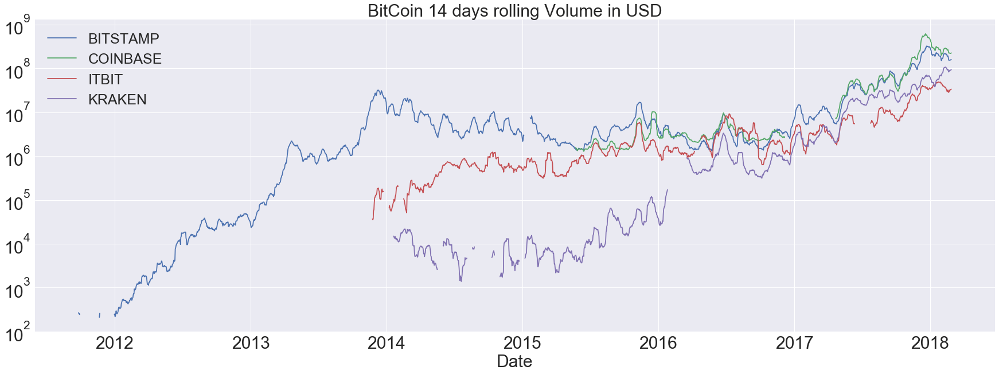

In [18]:
# Plot the revised dataframe, rolling average
btc_vol_datasets.rolling(14).mean().plot(logy=True)
title("Bitcoin 14 days rolling Volume in USD")
# savefig('fig/rolling_vol.jpeg', dpi=200, bbox_inches='tight')

In [19]:
# Calculate the average BTC price as a new column
btc_usd_datasets['avg_btc_price_usd'] = btc_usd_datasets.mean(axis=1)
btc_vol_datasets['tot_btc_vol_usd'] = btc_vol_datasets.sum(axis=1)

In [20]:
# Plot the average BTC price
btc_trace = go.Scatter(x=btc_usd_datasets.index, y=btc_usd_datasets['avg_btc_price_usd'])
py.iplot([btc_trace])

/Users/domi/anaconda3/envs/py35/lib/python3.5/site-packages/matplotlib/scale.py:111: RuntimeWarning:

invalid value encountered in less_equal



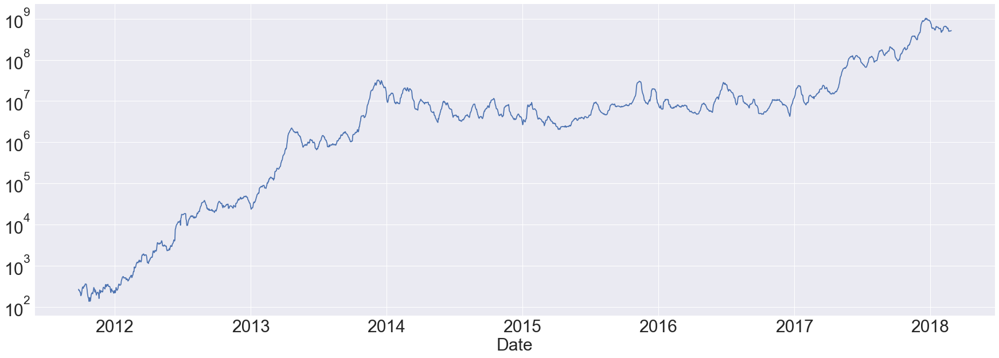

In [21]:
# Plot the average BTC volume
btc_vol_datasets.tot_btc_vol_usd.rolling(14).mean().plot(logy=True)

In [22]:
btc_usd_datasets.describe()

,BITSTAMP,COINBASE,ITBIT,KRAKEN,avg_btc_price_usd
count,2339.000000,902.000000,1538.000000,1465.000000,2342.000000
mean,1135.604363,2497.322572,1660.207748,1752.716205,1137.405716
std,2629.494262,3882.476114,3111.282901,3171.819796,2637.220124
min,2.240360,213.307686,105.830000,199.628389,2.240360
25%,93.230031,385.135869,362.383761,357.766479,93.390642
50%,373.374370,609.102063,575.233823,586.377662,373.281819
75%,665.240968,2707.795848,921.661487,1044.292210,668.362954
max,19110.244062,19455.628104,19247.277924,19135.469160,19237.154813


In [23]:
btc_vol_datasets.describe()

,BITSTAMP,COINBASE,ITBIT,KRAKEN,tot_btc_vol_usd
count,2.339000e+03,9.020000e+02,1.538000e+03,1.465000e+03,2.360000e+03
mean,1.688339e+07,5.230993e+07,4.831200e+06,8.239882e+06,4.498967e+07
std,4.975425e+07,1.276361e+08,1.039495e+07,2.062190e+07,1.534993e+08
min,1.227500e+00,4.365952e+05,3.074741e+01,1.999896e-02,0.000000e+00
25%,5.551881e+05,2.206555e+06,4.661790e+05,6.780220e+03,5.233640e+05
50%,2.587112e+06,3.287996e+06,1.198614e+06,1.611765e+05,4.955391e+06
75%,7.592309e+06,3.678669e+07,3.463524e+06,2.740528e+06,1.209364e+07
max,7.721430e+08,1.391748e+09,8.673934e+07,1.951897e+08,2.372325e+09


(17167, 17531)

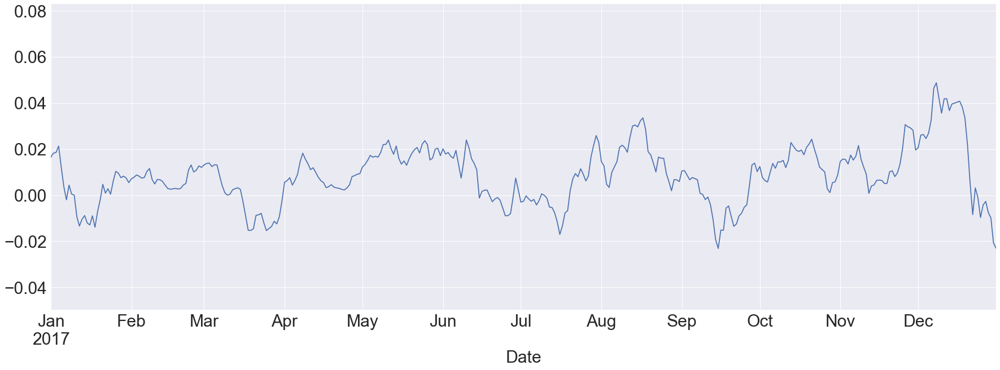

In [24]:
start_date = pd.datetime(2017,1,1)
end_date = pd.datetime(2017,12,31)
btc_usd_datasets.avg_btc_price_usd.pct_change().rolling(14).mean().plot()
xlim([start_date, end_date])

(17167, 17531)

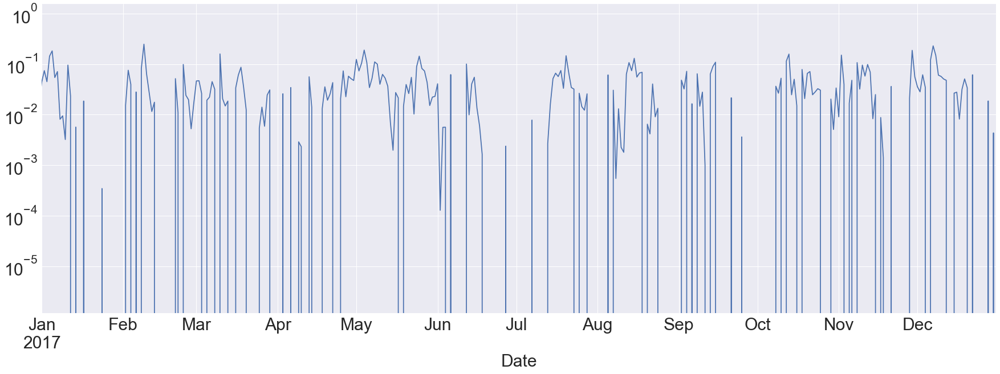

In [25]:
btc_vol_datasets.tot_btc_vol_usd.rolling(14).mean().pct_change().plot(logy=True)
xlim([start_date, end_date])

[Pytrends](https://github.com/GeneralMills/pytrends)

In [243]:
from pytrends.request import TrendReq
pytrends = TrendReq(hl='en-US', tz=360)

In [244]:
kw_list = ["Blockchain","BTC","hack"]
pytrends.build_payload(kw_list, cat=0, timeframe='today 5-y', geo='', gprop='')

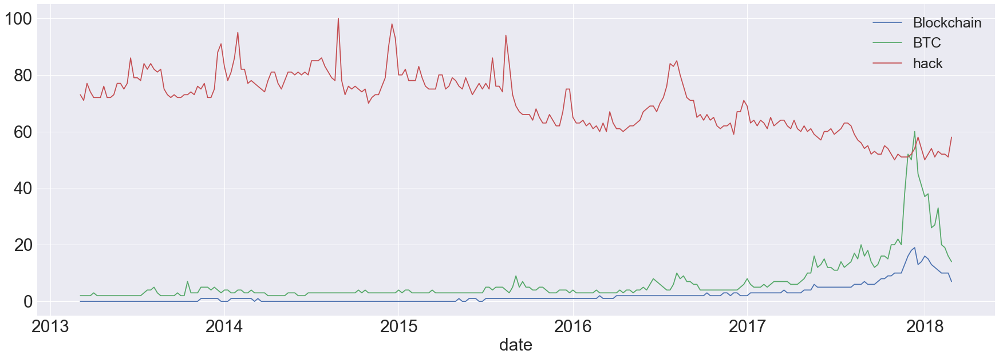

In [245]:
pytrends.interest_over_time().plot()

In [29]:
def get_json_data(json_url, cache_path):
    '''Download and cache JSON data, return as a dataframe.'''
    try:        
        f = open(cache_path, 'rb')
        df = pickle.load(f)   
        print('Loaded {} from cache'.format(json_url))
    except (OSError, IOError) as e:
        print('Downloading {}'.format(json_url))
        df = pd.read_json(json_url)
        df.to_pickle(cache_path)
        print('Cached {} at {}'.format(json_url, cache_path))
    return df

In [30]:
base_polo_url = 'https://poloniex.com/public?command=returnChartData&currencyPair={}&start={}&end={}&period={}'
start_date = datetime.strptime('2015-01-01', '%Y-%m-%d') # get data from the start of 2015
end_date = datetime.now() # up until today
pediod = 86400 # pull daily data (86,400 seconds per day)

def get_crypto_data(poloniex_pair):
    '''Retrieve cryptocurrency data from poloniex'''
    json_url = base_polo_url.format(poloniex_pair.replace('history/',''), start_date.timestamp(), end_date.timestamp(), pediod)
    data_df = get_json_data(json_url, poloniex_pair)
    data_df = data_df.set_index('date')
    return data_df

In [31]:
altcoins = ['ETH','LTC','XRP','ETC','STR','DASH','SC','XMR','XEM']

altcoin_data = {}
for altcoin in altcoins:
    coinpair = 'history/BTC_{}'.format(altcoin)
    crypto_price_df = get_crypto_data(coinpair)
    altcoin_data[altcoin] = crypto_price_df

Loaded https://poloniex.com/public?command=returnChartData&currencyPair=BTC_ETH&start=1420092000.0&end=1520399146.758591&period=86400 from cache
Loaded https://poloniex.com/public?command=returnChartData&currencyPair=BTC_LTC&start=1420092000.0&end=1520399146.758591&period=86400 from cache
Loaded https://poloniex.com/public?command=returnChartData&currencyPair=BTC_XRP&start=1420092000.0&end=1520399146.758591&period=86400 from cache
Loaded https://poloniex.com/public?command=returnChartData&currencyPair=BTC_ETC&start=1420092000.0&end=1520399146.758591&period=86400 from cache
Loaded https://poloniex.com/public?command=returnChartData&currencyPair=BTC_STR&start=1420092000.0&end=1520399146.758591&period=86400 from cache
Loaded https://poloniex.com/public?command=returnChartData&currencyPair=BTC_DASH&start=1420092000.0&end=1520399146.758591&period=86400 from cache
Loaded https://poloniex.com/public?command=returnChartData&currencyPair=BTC_SC&start=1420092000.0&end=1520399146.758591&period=86

In [32]:
# Calculate USD Price as a new column in each altcoin dataframe
for altcoin in altcoin_data.keys():
    altcoin_data[altcoin]['price_usd'] =  altcoin_data[altcoin]['weightedAverage'] * btc_usd_datasets['avg_btc_price_usd']

In [33]:
# Merge USD price of each altcoin into single dataframe 
combined_df = merge_dfs_on_column(list(altcoin_data.values()), list(altcoin_data.keys()), 'price_usd')

In [34]:
# Add BTC price to the dataframe
combined_df['BTC'] = btc_usd_datasets['avg_btc_price_usd']

In [35]:
# Chart all of the altocoin prices
df_scatter(combined_df, 'Cryptocurrency Prices (USD)', seperate_y_axis=False, y_axis_label='Coin Value (USD)', scale='log')

In [36]:
# Calculate the pearson correlation coefficients for cryptocurrencies in 2016
combined_df_2016 = combined_df[combined_df.index.year == 2016]
combined_df_2016.pct_change().corr(method='pearson')

,DASH,ETC,ETH,LTC,SC,STR,XEM,XMR,XRP,BTC
DASH,1.000000,0.003992,0.122695,-0.012194,0.026602,0.058083,0.014571,0.121537,0.088657,-0.014040
ETC,0.003992,1.000000,-0.181991,-0.131079,-0.008066,-0.102654,-0.080938,-0.105898,-0.054095,-0.170538
ETH,0.122695,-0.181991,1.000000,-0.064652,0.169642,0.035093,0.043205,0.087216,0.085630,-0.006502
LTC,-0.012194,-0.131079,-0.064652,1.000000,0.012253,0.113523,0.160667,0.129475,0.053712,0.750174
SC,0.026602,-0.008066,0.169642,0.012253,1.000000,0.143252,0.106153,0.047910,0.021098,0.035116
STR,0.058083,-0.102654,0.035093,0.113523,0.143252,1.000000,0.225132,0.027998,0.320116,0.079075
XEM,0.014571,-0.080938,0.043205,0.160667,0.106153,0.225132,1.000000,0.016438,0.101326,0.227674
XMR,0.121537,-0.105898,0.087216,0.129475,0.047910,0.027998,0.016438,1.000000,0.027649,0.127520
XRP,0.088657,-0.054095,0.085630,0.053712,0.021098,0.320116,0.101326,0.027649,1.000000,0.044161
BTC,-0.014040,-0.170538,-0.006502,0.750174,0.035116,0.079075,0.227674,0.127520,0.044161,1.000000


In [37]:
def correlation_heatmap(df, title, absolute_bounds=True):
    '''Plot a correlation heatmap for the entire dataframe'''
    heatmap = go.Heatmap(
        z=df.corr(method='pearson').as_matrix(),
        x=df.columns,
        y=df.columns,
        colorbar=dict(title='Pearson Coefficient'),
    )
    
    layout = go.Layout(title=title)
    
    if absolute_bounds:
        heatmap['zmax'] = 1.0
        heatmap['zmin'] = -1.0
        
    fig = go.Figure(data=[heatmap], layout=layout)
    py.iplot(fig)

In [38]:
correlation_heatmap(combined_df_2016.pct_change(), "Cryptocurrency Correlations in 2016")

In [39]:
combined_df_2017 = combined_df[combined_df.index.year == 2017]
combined_df_2017.pct_change().corr(method='pearson')

,DASH,ETC,ETH,LTC,SC,STR,XEM,XMR,XRP,BTC
DASH,1.000000,0.387555,0.506911,0.340153,0.291424,0.183038,0.325968,0.498418,0.091146,0.307095
ETC,0.387555,1.000000,0.601437,0.482062,0.298406,0.210387,0.321852,0.447398,0.114780,0.416562
ETH,0.506911,0.601437,1.000000,0.437609,0.373078,0.259399,0.399200,0.554632,0.212350,0.410771
LTC,0.340153,0.482062,0.437609,1.000000,0.339144,0.307589,0.379088,0.437204,0.323905,0.420645
SC,0.291424,0.298406,0.373078,0.339144,1.000000,0.402966,0.331350,0.378644,0.243872,0.325318
STR,0.183038,0.210387,0.259399,0.307589,0.402966,1.000000,0.339502,0.327488,0.509828,0.230957
XEM,0.325968,0.321852,0.399200,0.379088,0.331350,0.339502,1.000000,0.336076,0.268168,0.329431
XMR,0.498418,0.447398,0.554632,0.437204,0.378644,0.327488,0.336076,1.000000,0.226636,0.409183
XRP,0.091146,0.114780,0.212350,0.323905,0.243872,0.509828,0.268168,0.226636,1.000000,0.131469
BTC,0.307095,0.416562,0.410771,0.420645,0.325318,0.230957,0.329431,0.409183,0.131469,1.000000


In [40]:
correlation_heatmap(combined_df_2017.pct_change(), "Cryptocurrency Correlations in 2017")

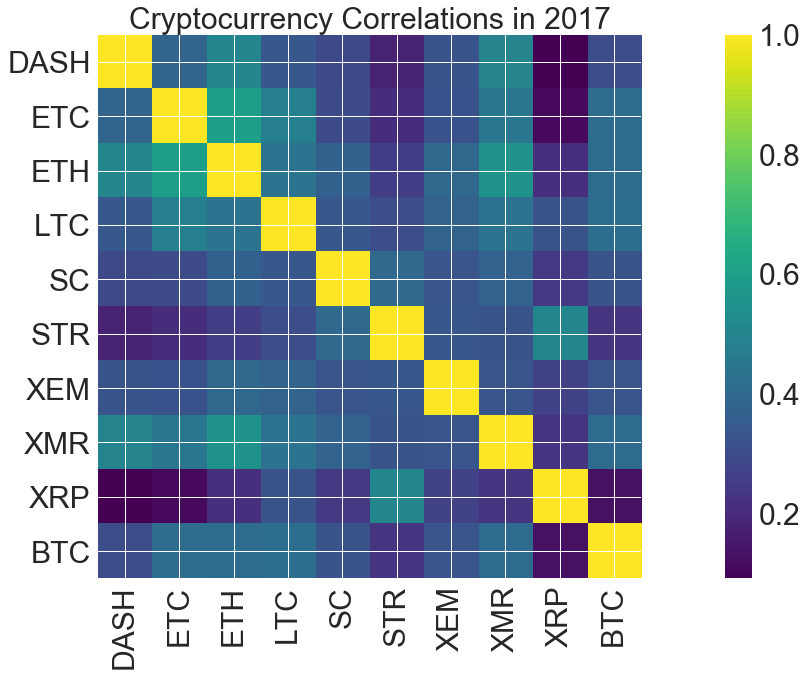

In [332]:
# figure(figsize=(16,16))
imshow(combined_df_2017.pct_change().corr(), cmap='viridis')
title("Cryptocurrency Correlations in 2017")
colorbar()
xticks(arange(10), combined_df_2017.columns, rotation=90)
yticks(arange(10), combined_df_2017.columns)
savefig('fig/altcoin.jpeg', dpi=200, bbox_inches='tight')

In [327]:
combined_df_2017.columns

Index(['DASH', 'ETC', 'ETH', 'LTC', 'SC', 'STR', 'XEM', 'XMR', 'XRP', 'BTC'], dtype='object')

### crawl WSJ news archive

In [41]:
import requests
from bs4 import BeautifulSoup

#### build database to save crawled news
[pandas with SQLite](https://www.dataquest.io/blog/python-pandas-databases/)

[pandas ](https://www.ryanbaumann.com/blog/2016/4/30/python-pandas-tosql-only-insert-new-rows)

Steps
1. check if in database
2. update database
3. fetch news

In [42]:
def archive_link(ts):
    return "http://www.wsj.com/public/page/archive-%s.html" % ts.date().isoformat()

def news_archive(ts):
    news = []
    link = archive_link(ts)
    response = requests.get(link)
    assert response.ok, link
    
    soup = BeautifulSoup(response.text, "html5lib")
    pieces = soup.find("ul", {"class":"newsItem"}).find_all('li')
    for piece in pieces:
        title = piece.find('h2').text
        url = piece.find('a')['href']
        content = piece.find('p').text
#         _, title2, content = piece.find('p').text.splitlines()
        news.append([ts, title, content, url])
    return news
#     return pd.DataFrame(news, columns=['date','title', 'content', 'url'])

In [43]:
start_date = pd.datetime(2017,1,1)
end_date = pd.datetime(2017,12,31)
btc_usd_datasets.index

DatetimeIndex(['2011-09-13', '2011-09-14', '2011-09-15', '2011-09-16',
               '2011-09-17', '2011-09-18', '2011-09-19', '2011-09-20',
               '2011-09-21', '2011-09-22',
               ...
               '2018-02-18', '2018-02-19', '2018-02-20', '2018-02-21',
               '2018-02-22', '2018-02-23', '2018-02-24', '2018-02-25',
               '2018-02-26', '2018-02-27'],
              dtype='datetime64[ns]', name='Date', length=2360, freq='D')

In [44]:
all_news = pd.read_csv('data/wsj_archive.gz', parse_dates=['date'])
if start_date.date() < all_news.date[0].date() or (end_date.date() > all_news.date.iloc[-1].date()):
    updates = []
    for date in set(pd.date_range(start=start_date, end=end_date, freq='D')) - set(all_news.date):
        updates += news_archive(date)
    updates = pd.DataFrame(updates, columns=['date','title', 'content', 'url'])
    all_news.append(updates).sort_values('date').to_csv('data/wsj_archive.gz', index=None, compression='gzip')

In [45]:
import sqlite3
conn = sqlite3.connect("data/wsj_news.db")
cur = conn.cursor()
try:
    updates
except:
    pass
else:
    updates.to_sql('archive', conn, if_exists='append', index=False)
sql_news = pd.read_sql_query("select * from archive;", conn, parse_dates=['date'])
cur.close()
conn.close()

#### Get holiday information
[api website](https://holidayapi.com/)

In [46]:
import json
import requests

class v1:
    key = None

    def __init__(self, key):
        self.key = key

    def holidays(self, parameters):
        url = 'https://holidayapi.com/v1/holidays?'

        if 'key' not in parameters.keys():
            parameters['key'] = self.key

        response = requests.get(url, params=parameters);
        data     = json.loads(response.text)

        if response.status_code != 200:
            if data.has_key('error') is False:
                data['error'] = 'Unknown error.'

        return data

In [47]:
hapi = v1("e8fe3d7c-d22c-4809-89a4-8fbecbc1eba9")

parameters = {
	# Required
	'country': 'US',
	'year':    2017,
	# Optional
	# 'month':    7,
	# 'day':      4,
	# 'previous': True,
	# 'upcoming': True,
	# 'public':   True,
	# 'pretty':   True,
}

# US_hdays = hapi.holidays(parameters)
# US_hdates = pd.DataFrame.from_dict(pd.DataFrame.from_dict(US_hdays.get('holidays'), orient='index').loc[:,0].to_dict(), orient='index').sort_values('date')
# US_hdates.index = pd.to_datetime(US_hdates.index)
# US_hdates.to_csv('data/us_holidays.gz', index=None, compression='gzip')

parameters = {
	# Required
	'country': 'CN',
	'year':    2017,
	# Optional
	# 'month':    7,
	# 'day':      4,
	# 'previous': True,
	# 'upcoming': True,
	# 'public':   True,
	# 'pretty':   True,
}

# CN_hdays = hapi.holidays(parameters)
# CN_hdates = pd.DataFrame.from_dict(pd.DataFrame.from_dict(CN_hdays.get('holidays'), orient='index').loc[:,0].to_dict(), orient='index')
# CN_hdates.index = pd.to_datetime(CN_hdates.index)
# CN_hdates.to_csv('data/cn_holidays.gz', index=None, compression='gzip')

In [48]:
US_hdates = pd.read_csv('data/us_holidays.gz')

In [49]:
CN_hdates = pd.read_csv('data/cn_holidays.gz')

### Statistics of News data
~~03/01/2018 version~~

~~from 2011-09-13 to 2012-09-12~~ ~~67579~~

03/02/2018 version

> ~~30094	2012-02-24	The Surveillance Catalog	NaN~~	
> ~~http://www.wsj.com/articles/SB1000142405297020...~~


from 2017-01-01 to 2017-12-31

1. drop NaN value: 1
```
10593	2017-01-08	Test Your Smarts on the ‘Star Wars’ Market, Ra...	NaN	http://www.wsj.com/articles/test-your-smarts-o...
```
2. format the content
```
remove '\n' and extra space
```

3. remove duplicated: 1294 -> 1995
```
count                                    1294 -> 1995
unique                                    226 -> 72
top       Pepper...and Salt Pepper...and Salt -> ...
freq                                      306 -> 687
```

entries: 66284 -> 43268

In [50]:
all_news = pd.read_csv('data/wsj_archive.gz', parse_dates=['date'])
all_news.shape

(112843, 4)

In [51]:
news = all_news[(all_news.date>=start_date) & (all_news.date<=end_date)].sort_values('date').reset_index(drop=True)

In [52]:
# drop NaN value
news.dropna(inplace=True)
# format the content
news.content = news.content.str.split().map(lambda x: ' '.join(x))
# check duplicates
news.content[news.content.duplicated()].describe()

count                                                1995
unique                                                 72
top       What’s News: World-Wide What’s News: World-Wide
freq                                                  687
Name: content, dtype: object

In [53]:
# drop duplicated
news.drop_duplicates(subset=['content'], keep='first', inplace=True) 
## change first to False and redo wiki and ap models
news = news.reset_index(drop=True)
# news.content.to_csv('data/wsj_content', index=None, sep='\n')
print(news.shape)

(43268, 4)


### Sentiment analysis

#### Polarity and subjectivity
* [textblob](https://github.com/sloria/TextBlob): [train with textbolb](http://datasynce.org/2017/05/sentiment-analysis-on-python-through-textblob/)
* [twitter trained on keras](https://www.bonaccorso.eu/2017/08/07/twitter-sentiment-analysis-with-gensim-word2vec-and-keras-convolutional-networks/)

#### Topic Classification
* [Topic modeling](https://medium.com/mlreview/topic-modeling-with-scikit-learn-e80d33668730)
* [notebook for topic analysis](https://github.com/robinsones/NYTimes-and-Trump/blob/master/Trump_NYTimes_Analysis.ipynb)

In [54]:
# # generate polarity and subjectivity with TextBlob
# from textblob import TextBlob

# news['polarity'] = news.apply(lambda x: TextBlob(x['content']).sentiment.polarity, axis=1)
# news['subjectivity'] = news.apply(lambda x: TextBlob(x['content']).sentiment.subjectivity, axis=1)

In [55]:
# news.loc[:, ['polarity','subjectivity']].to_csv('data/sentiment.gz', index=None, compression='gzip')
news = pd.concat([news, pd.read_csv('data/sentiment.gz')], axis=1)

In [493]:
# from nltk.corpus import stopwords
# from sklearn.feature_extraction.stop_words import ENGLISH_STOP_WORDS
# from sklearn.decomposition import NMF
# from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer

In [494]:
# # set of stopwords
# STOPLIST = set(stopwords.words('english') + list(ENGLISH_STOP_WORDS))
# STOPLIST = list(STOPLIST)

In [495]:
# tfidf_vectorizer = TfidfVectorizer(max_df = 0.4, min_df = 15,
#                                    stop_words = STOPLIST)
# tfidf = tfidf_vectorizer.fit_transform(news.content)
# tfidf_feature_names = tfidf_vectorizer.get_feature_names()
# nmf = NMF(n_components = 30, random_state=1, alpha=.1, l1_ratio=.5).fit(tfidf)

In [496]:
# tfidf.shape

(43268, 7560)

In [497]:
# transformed_data = nmf.transform(tfidf)

In [498]:
# transformed_data.shape

(43268, 30)

In [499]:
# def zero_equals_1(x): 
#     if x != 0:
#         return 1
#     else:
#         return x

In [500]:
# transformed_data = pd.DataFrame(transformed_data)
# article_topics = transformed_data.applymap(zero_equals_1)
# article_topics["Date"] = news.date
# article_topics["Article_Num"] = range(1, len(article_topics) + 1)
# article_topics.columns = article_topics.columns.astype('str')
# # melted_df = pd.melt(article_topics, id_vars = ["Article_Num", "Date"], var_name = "Topic_Num")

In [64]:
# def print_top_words(model, feature_names, n_top_words):
#     n_article = article_topics.drop('Article_Num', axis=1).sum(axis=0)
#     for topic_idx, topic in enumerate(model.components_):
#         print("Topic #%d; Number of Article: %d" % (topic_idx, n_article[topic_idx]))
#         print(" ".join([feature_names[i]
#                         for i in topic.argsort()[:-n_top_words - 1:-1]]))
#     print()

In [65]:
# print_top_words(nmf, tfidf_feature_names, 20)

```
Topic #0; Number of Article: 9022
russia election russian presidential senate putin probe campaign 2016 french sanctions intelligence party fbi investigation moscow comey interference political committee
Topic #1; Number of Article: 1086
corrections amplifications edition 2017 jan oct aug sept nov july june april march feb dec 24 26 28 17 21
Topic #2; Number of Article: 5066
gerard baker editor scoops guided stories tour point personal 10 journal wall chief best day street trump travel ban latest
Topic #3; Number of Article: 10989
trump president donald administration obama immigration order policy said elect ban mr travel secretary campaign office agenda says washington leaders
Topic #4; Number of Article: 8486
new york jersey cuomo gov art andrew times office book manhattan authority study way research zealand fiction museum shows yorkers
Topic #5; Number of Article: 4087
news media marketing advertising cmo roundup happenings today morning industry biggest ad facebook fox ads google tv digital snap youtube
Topic #6; Number of Article: 5605
tax plan overhaul gop reform republicans senate code taxes corporate cut republican cuts congress income rate pass businesses proposal budget
Topic #7; Number of Article: 3489
review outlook reform trump obama reviews obamacare gop good political labor democrats britain rule film gigot editorial needs putin growth
Topic #8; Number of Article: 5819
oil prices opec production crude energy output gas saudi week cuts rose supply drilling producers global rig rigs count stockpiles
Topic #9; Number of Article: 3836
korea north south korean missile nuclear pyongyang sanctions kim military jong threat tensions ballistic test weapons defense seoul japan launch
Topic #10; Number of Article: 8491
fed federal reserve rates rate inflation yellen raise economy policy meeting year term janet minutes officials increase short increases chairwoman
Topic #11; Number of Article: 3572
photos day editors wall journal selected street chosen sunday thursday friday tuesday wednesday monday march aug celebrate dec june india
Topic #12; Number of Article: 5389
china chinese beijing xi world jinping economy global yuan foreign market growth largest sea country hong kong communist alibaba economic
Topic #13; Number of Article: 10620
quarter earnings profit sales revenue watch growth results scheduled market fourth report second year reported closes expected fiscal know need
Topic #14; Number of Article: 5321
health care gop act affordable senate republicans insurance republican repeal law vote insurers obamacare senators medicaid overhaul legislation democrats replace
Topic #15; Number of Article: 7618
dollar gold prices data rose higher fell copper month weaker investors high level falls metals edged week gains friday lower
Topic #16; Number of Article: 8347
state islamic tillerson syria forces iraq military said iraqi attack officials killed militants secretary rex budget isis mosul california gov
Topic #17; Number of Article: 6368
brexit european eu union minister prime theresa britain europe talks british bloc negotiations deal brussels macron london political pound leaders
Topic #18; Number of Article: 6487
billion debt deal treasury buy sell auction comprising fund sold securities department previously agreed equity week firm private group stake
Topic #19; Number of Article: 11284
investors stocks market stock markets shares funds dow rally bond 500 companies fund gains emerging trading year global indexes industrial
Topic #20; Number of Article: 2591
house white republicans republican security adviser director staff gop said committee flynn ryan communications senior home rep mike press aide
Topic #21; Number of Article: 4742
best books week web selling ended data bookscan npd children gurdon meghan cox author fiction reviews sacks tom sam mysteries
Topic #22; Number of Article: 31490
company chief business executive said ceo world financial companies year firm uber group people plans says technology years car maker
Topic #23; Number of Article: 4528
court supreme judge appeals gorsuch case ban ruling travel justice federal neil ruled law bankruptcy order legal nominee justices judges
Topic #24; Number of Article: 7688
million home estate real property pay homes lists settle asks funding manhattan 100 raised agreed startup square beach raises housing
Topic #25; Number of Article: 5761
street heard wall big banks apple growth good investors main drug chip tech needs price looks tesla makers markets industry
Topic #26; Number of Article: 4747
trade free mexico canada nafta american deficit agreement surplus exports talks global imports pact administration economic canadian pacific mexican economy
Topic #27; Number of Article: 6143
bank central ecb banks policy european rate inflation monetary eurozone stimulus deutsche financial england canada bond japan draghi rates economy
Topic #28; Number of Article: 4599
government bonds bond yields treasurys prices yield strengthened debt note year pulled inflation strengthen treasury selloff data assets demand 10
Topic #29; Number of Article: 5941
city york mayor police blasio nyc council officials schools man department school mayoral public officers said housing bronx people island

```

* Interested topics:
    * 0 russia, election
    * _3 trump president_
    * 5 new media marketing
    * 6 tax plan
    * 8 oil price
    * 9 korea north
    * 10 fed federal reserve
    * 12 china chinese beijing (yuan)
    * 15 dollar gold
    * 16 state islamic
    * 17 brexit european
    * 19 investors stocks
    * 24 million home estate
    * 25 street heard wall (apple tech chip)
    * 26 trade free
    * 27 bank central
    * 28 government bonds
    
    `[0, 3, 5, 6, 8 ,9, 10, 12, 15, 16, 17, 19, 24, 25, 26, 27, 28]`

* Nonsense topics
> 1, 11, 13, 18, 21, 23, 29

In [66]:
# article_topics.to_csv('data/to_topics.gz', index=None, compression='gzip')

In [67]:
article_topics = pd.read_csv('data/to_topics.gz', parse_dates=['Date'])

In [68]:
article_topics.shape

(43268, 32)

In [69]:
article_topics.keys() # 0:29 one-hot topic representation

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24',
       '25', '26', '27', '28', '29', 'Date', 'Article_Num'],
      dtype='object')

In [70]:
# correlation_heatmap(article_topics.loc[:, [str(i) for i in range(30)]],'')

### Topic grouping by Sentiment

No good result

In [71]:
def senti(df, method = 'mean', roll_win = 1, feat = 'sentiment'):
    if method == 'median':
        return df.groupby(['date']).median()[feat].rolling(roll_win).median()
    elif method == 'sum':
        return df.groupby(['date']).sum()[feat].rolling(roll_win).mean()
    else:
        return df.groupby(['date']).mean()[feat].rolling(roll_win).mean()

In [72]:
topics = pd.DataFrame()
for t_id in range(30):
#     print(t_id, t_name)
    topic_id = [str(t_id)]
    one_topic = news[article_topics.loc[:,topic_id].sum(axis=1)>0]
    topics[str(t_id)] = senti(one_topic, feat='polarity')

In [73]:
topics.replace(np.nan, 0, inplace=True)

In [74]:
correlation_heatmap(topics, 'Topic Correlation')

In [75]:
topic_corr = (topics.corr())

In [76]:
mask = (topic_corr<0.01) & (topic_corr>-0.01)
pairs = np.where(mask)
Counter(pairs[0])

Counter({3: 1,
         5: 3,
         7: 1,
         8: 1,
         9: 2,
         12: 1,
         17: 2,
         20: 2,
         23: 2,
         24: 3,
         26: 1,
         28: 1})

In [77]:
pairs

(array([ 3,  5,  5,  5,  7,  8,  9,  9, 12, 17, 17, 20, 20, 23, 23, 24, 24,
        24, 26, 28]),
 array([24,  9, 17, 20, 28, 23,  5, 24, 24,  5, 23,  5, 26,  8, 17,  3,  9,
        12, 20,  7]))

In [78]:
# mask = (topic_corr<0.01) & (topic_corr>-0.01)
hi_pairs = np.where((topic_corr<1) & (topic_corr>0.5))
Counter(hi_pairs[0])

Counter({6: 1, 14: 1})

Text(0.5,1,'Pearson Correlation between modeled Topics')

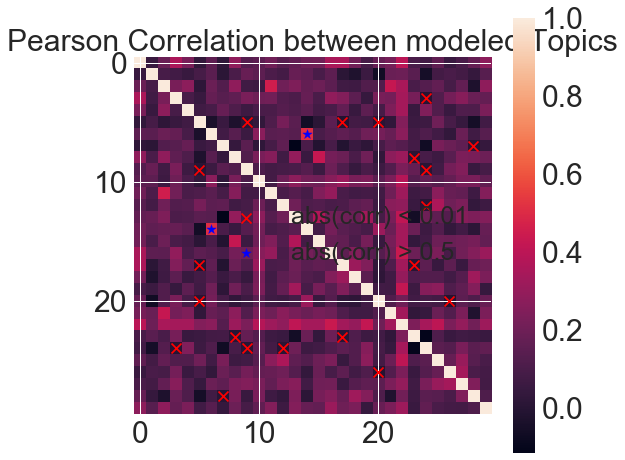

In [79]:
fig = figure(figsize=(8,8))
scatter(pairs[0], pairs[1], marker='x', s=100, c='r')#, vmin=min(wiki_Tcorr.min()))
scatter(hi_pairs[0], hi_pairs[1], marker='*', s=100, c='b')#, vmin=min(wiki_Tcorr.min()))
legend(['abs(corr) < 0.01', 'abs(corr) > 0.5'])
imshow(topics.corr())
colorbar()
title("Pearson Correlation between modeled Topics")
# savefig('fig/topic_corr.jpeg', dpi=200, bbox_inches='tight')

In [80]:
# # pd.melt: one-hot rows to cells
# melted_df.shape 

In [81]:
# melted_df.Topic_Num.describe()

In [82]:
# import calendar
# def extract_month_year(date):
#     month = date.month
#     month_name = calendar.month_name[month]
#     year = date.year
#     return month_name + " " + str(year)

In [83]:
# melted_df["Month_Year"] = melted_df["Date"].apply(lambda x: extract_month_year(x))

In [84]:
# # melted_df.groupby("Topic_Num").sum().sort_values("value").reset_index()
# bar(arange(30),article_topics.drop('Article_Num',axis=1).sum(axis=0))
# title("Number of Article per Topic")

In [85]:
topic_list = ['0', '3', '5', '6', '8', '9', '10', '12', '15', 
            '16', '17', '19', '24', '25', '26', '27', '28']

In [86]:
# melted_df = melted_df[melted_df["Topic_Num"].isin(topic_list)]

In [341]:
# exam news by topic
topic_id = ['9']
# news.content[(melted_df.value[melted_df.Topic_Num == topic_id]==1.0).values].sample(5) # same
news.content[article_topics.loc[:,topic_id].sum(axis=1)>0].sample(5)

20525    South Korea: Stance on U.S. Missile-Defense System Hasn’t Shifted A top South Korean national-security official sought to tamp down concerns about the government’s commitment to a controversial U....
12577                                                               Could a Faltering Shinzo Abe Achieve All This? The office of Japan’s prime minister responds to worries that Mr. Abe may be losing momentum.
18901    U.S. Plans Missile Defense Test Amid Concern Over North Korea The Pentagon is planning to conduct a test next week of a system designed to shoot down intercontinental missiles, U.S. defense offici...
31455    J.P. Morgan Pledges Increased Support for Chicago J.P. Morgan Chase has pledged $40 million to help ailing neighborhoods on Chicago’s south and west sides, following a similar model it applied in ...
14274    North Korean Nuclear Threat Fuels Outsider’s Election Hopes in South Hong Joon-pyo has found hope in escalating tensions with Pyongyang over its nuclear pr

In [371]:
topic_num_to_name = {'0' : "Russia Hack Election",
                    '3' : "President Trump ",
                    '5' : "FANG Tech Company",
                    '6' : "Tax Plan Reform",
                    '8' : "Crude Oil",
                    '9' : "North Korea Nuclear",
                    '10' : "Federal Inflation Rate",
                    '12' : "Chinese Economy",
                    '15' : "Dollar & Metal",
                    '16' : "ISIS",
                    '17' : "Brexit in EU",
                    '19' : "SP500 Maket",
                    '24' : "US Housing",
                    '25' : "Maker Industry",
                    '26' : "North American",
                    '27' : "EU Eurozone",
                    '28' : "Federal Bonds"}

In [89]:
topic_num_to_name = pd.DataFrame.from_dict(topic_num_to_name, orient = "index").reset_index()
topic_num_to_name.columns = ["Topic_Num", "Topic_Name"]
# final_df = melted_df.merge(topic_num_to_name, on = "Topic_Num")

In [90]:
overall_topics = pd.DataFrame({"Security": ['0', '9', '16', "NaN", "NaN", "NaN"], 
                               "Goverment": ['3', '6', '10', '17', '28', "NaN"], 
                               "Market": ['5', '8', '15', '19', '24', '25'], 
                               "Global": ['12', '26', '27', "NaN", "NaN", "NaN"]})

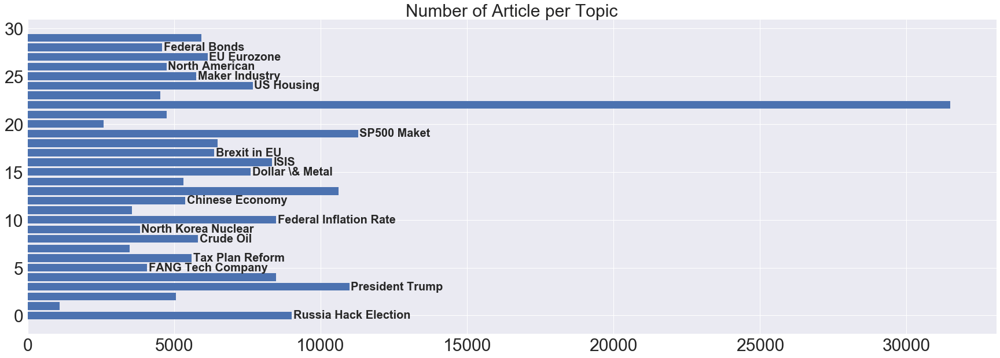

In [91]:
# fig = figure(figsize=(12,8))
barh(arange(30),article_topics.drop('Article_Num',axis=1).sum(axis=0))
for i,v in enumerate(article_topics.drop('Article_Num',axis=1).sum(axis=0)):
    if str(i) in topic_num_to_name.Topic_Num.values:
        text(v+50, i-0.3, dict(topic_num_to_name.values).get(str(i)), fontweight='bold', fontsize=20)
title("Number of Article per Topic")
# savefig("fig/perTopic.jpeg", dpi=200, bbox_inches='tight')

In [92]:
# melted_ot = pd.melt(overall_topics)
# melted_ot = melted_ot[melted_ot["value"] != "NaN"]
# melted_ot.columns = ["Overall Topic", "Topic_Num"]

In [93]:
# final_df = final_df.merge(melted_ot, on = "Topic_Num")

In [94]:
# final_df = final_df.groupby(["Month_Year", "Topic_Num", "Topic_Name", "Overall Topic"]).sum().reset_index()
# final_df = final_df.drop('Article_Num', axis=1).rename(columns={'Topic_Name': 'Topic Name'})

In [95]:
# day_df = melted_df.merge(topic_num_to_name, on = "Topic_Num")
# day_df = day_df.merge(melted_ot, on = "Topic_Num")
# day_df = day_df.groupby(["Date", "Topic_Num", "Topic_Name", "Overall Topic"]).sum().reset_index()
# day_df = day_df.drop('Article_Num', axis=1).rename(columns={'Topic_Name': 'Topic Name'})

In [96]:
# final_df.to_csv('data/month_topic.gz', index=None, compression='gzip')
# day_df.to_csv('data/day_topic.gz', index=None, compression='gzip')

In [97]:
final_df = pd.read_csv('data/month_topic.gz')
day_df = pd.read_csv('data/day_topic.gz')

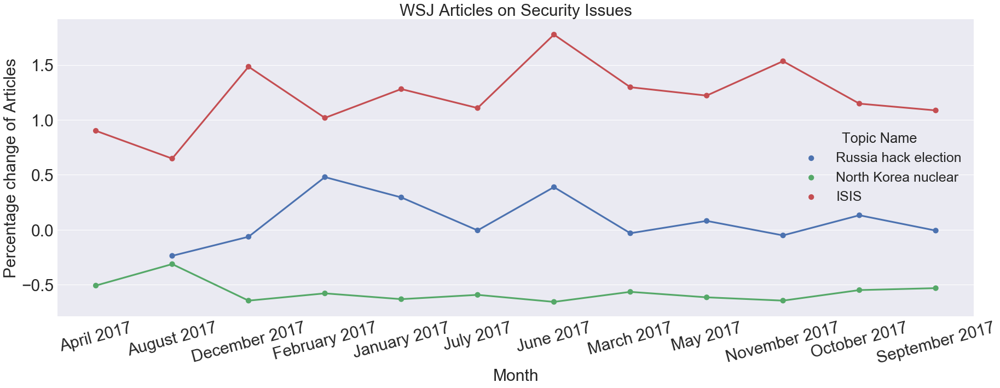

In [98]:
order = ["January 2017", "February 2017", "March 2017", "April 2017", "May 2017", "June 2017", "July 2017", 
         "August 2017", "September 2017", "October 2017","November 2017", "December 2017" ]
one_topic = final_df[final_df["Overall Topic"] == "Security"]
g = sns.pointplot(ci = None, x = one_topic["Month_Year"], 
                  y = one_topic["value"].pct_change(), hue = one_topic["Topic Name"])
plt.xticks(rotation=15)
g.set(xlabel = "Month", ylabel = "Percentage change of Articles", title = "WSJ Articles on Security Issues")
# plt.savefig("fig/Security_Issues.jpeg", dpi=200, bbox_inches='tight')

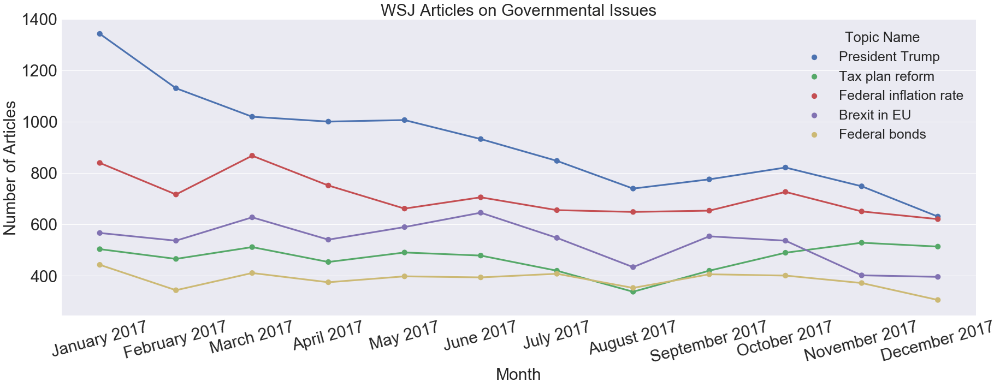

In [99]:
order = ["January 2017", "February 2017", "March 2017", "April 2017", "May 2017", "June 2017", "July 2017", 
         "August 2017", "September 2017", "October 2017","November 2017", "December 2017" ]
one_topic = final_df[final_df["Overall Topic"] == "Goverment"]
g = sns.pointplot(ci = None, x = one_topic["Month_Year"], 
                  y = one_topic["value"], order = order, hue = one_topic["Topic Name"])
plt.xticks(rotation=15)
g.set(xlabel = "Month", ylabel = "Number of Articles", title = "WSJ Articles on Governmental Issues")
# plt.savefig("fig/Governmental_Issues.jpeg", dpi=200, bbox_inches='tight')

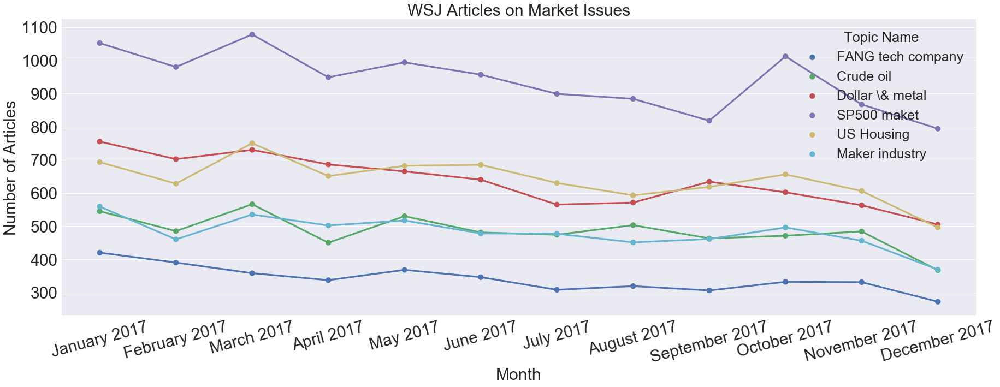

In [100]:
order = ["January 2017", "February 2017", "March 2017", "April 2017", "May 2017", "June 2017", "July 2017", 
         "August 2017", "September 2017", "October 2017","November 2017", "December 2017" ]
one_topic = final_df[final_df["Overall Topic"] == "Market"]
g = sns.pointplot(ci = None, x = one_topic["Month_Year"], 
                  y = one_topic["value"], order = order, hue = one_topic["Topic Name"])
plt.xticks(rotation=15)
g.set(xlabel = "Month", ylabel = "Number of Articles", title = "WSJ Articles on Market Issues")
# plt.savefig("fig/Market_Issues.jpeg", dpi=200, bbox_inches='tight')

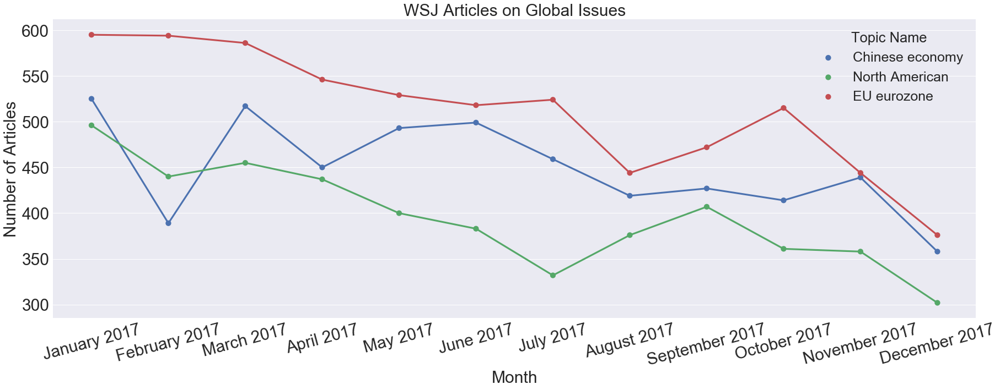

In [101]:
order = ["January 2017", "February 2017", "March 2017", "April 2017", "May 2017", "June 2017", "July 2017", 
         "August 2017", "September 2017", "October 2017","November 2017", "December 2017" ]
one_topic = final_df[final_df["Overall Topic"] == "Global"]
g = sns.pointplot(ci = None, x = one_topic["Month_Year"], 
                  y = one_topic["value"], order = order, hue = one_topic["Topic Name"])
plt.xticks(rotation=15)
g.set(xlabel = "Month", ylabel = "Number of Articles", title = "WSJ Articles on Global Issues")
# plt.savefig("fig/Global_Issues.jpeg", dpi=200, bbox_inches='tight')

In [373]:
topic_num_to_name.get('0')

'Russia Hack Election'

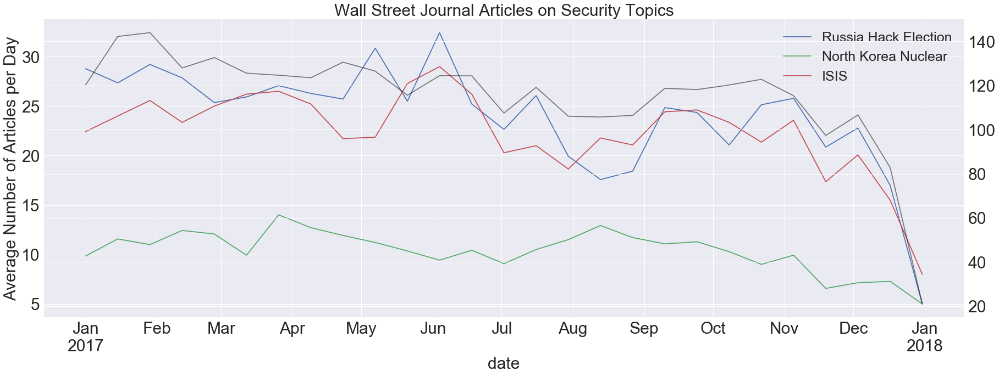

In [420]:
# average amount of news vs security news
fig = figure()
ax = fig.add_subplot(111)

for topic_id in ['0', '9', '16']:
    news[article_topics.loc[:,topic_id]==1].groupby('date').count().resample('14D').mean().title.plot(
        ax=ax, label=topic_num_to_name.get(topic_id))
legend()

title("Wall Street Journal Articles on Security Topics")
ylabel("Average Number of Articles per Day")

# xticks(rotation=15)
ax2 = ax.twinx()
news.groupby('date').count().resample('14D').mean().title.plot(c='k',
                                                               alpha=0.5, ax=ax2)


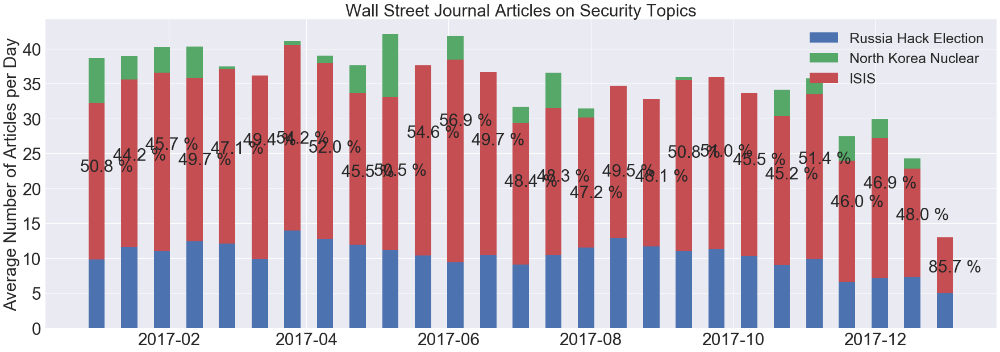

In [484]:
# average amount of news vs security news
fig = figure()
ax = fig.add_subplot(111)

# t0 = news[article_topics.loc[:,'0']==1].groupby('date').count().resample('14D').mean().title
# t9 = news[article_topics.loc[:,'9']==1].groupby('date').count().resample('14D').mean().title
# t16 = news[article_topics.loc[:,'16']==1].groupby('date').count().resample('14D').mean().title
# wsj = news.groupby('date').count().resample('14D').mean().title

width = 7
bar(t0.index, t0.values, width, label=topic_num_to_name.get('0'))
bar(t9.index, t9.values, width, bottom=t0.values, label=topic_num_to_name.get('9'))
bar(t16.index, t16.values, width, bottom=t9.values, label=topic_num_to_name.get('16'))

t_all= t0.values+t9.values+t16.values 


legend()

title("Wall Street Journal Articles on Security Topics")
ylabel("Average Number of Articles per Day")

# xticks(wsj.index,rotation=15)
# ax2 = ax.twinx()
for i in range(len(t_all)):
    ax.text(wsj.index[i]-pd.Timedelta('7d'), t16.values[i], s="%.1f %%" % (t_all[i]/wsj.values[i]*100))

# ax2.ylabel("Percentage of all Articles")
# plot(wsj.index, wsj.values, c='k', alpha=0.5)

# savefig('fig/news_over_time.jpeg', dpi=200, bbox_inches='tight')

### Explore News sentiment

In [102]:
news.describe()

,polarity,subjectivity
count,43268.000000,43268.000000
mean,0.083474,0.362099
std,0.204848,0.235695
min,-1.000000,0.000000
25%,0.000000,0.200000
50%,0.050000,0.365909
75%,0.185714,0.500000
max,1.000000,1.000000


In [103]:
news.sample(5).loc[:, ['date','title','polarity','subjectivity']]

,date,title,polarity,subjectivity
39473,2017-11-21,Mugabe Resigns as Zimbabwe’s Leader After 37 Y...,-0.127778,0.194444
39784,2017-11-24,"For the Pope’s Trip in Asia, a Delicate Balance",-0.150000,0.500000
39830,2017-11-25,"As Risk of War Looms, South Korea Weighs Chang...",0.012500,0.200000
10860,2017-03-23,"Document: Russia Uses Rigged Polls, Fake News ...",-0.156250,0.281250
37461,2017-11-03,Fortress Hires Deutsche Hedge Fund Team Amid L...,0.100000,0.366667


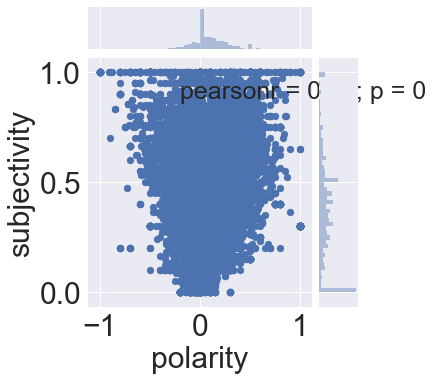

In [104]:
sns.jointplot(x='polarity', y='subjectivity', data=news)

In [334]:
pd.options.display.max_colwidth = 200

In [337]:
news[news.polarity < np.percentile(news.polarity, 1)].content.sample(3)

2036                                                        Tomlin Calls Brown’s Postgame Video ‘Selfish’ The Steelers coach expresses regret over Facebook post that caught Tomlin disparaging Patriots
34279                                                                                         It’s Time to End Ineffective And Cruel Animal Testing Testing drugs on animals is notoriously ineffective.
9694     Process of Probate Is Used Often for Planned Estates Probate gets a bad name based on the relatively few estates that go through ugly and sometimes years-long will contests in probate courts.
Name: content, dtype: object

In [339]:
news[news.polarity > np.percentile(news.polarity, 99)].content.sample(3)

15364    Verizon Invests in Self-Driving Car Startup Renovo Verizon has invested in Renovo Auto, an autonomous-vehicle tech startup best known for turning a vintage DeLorean into a self-driving car.
17542                      Beware the CEO Who Doesn’t Win an Award A study finds that chief executives who don’t win awards, while their rivals do, often go on to make acquisitions of dubious value.
10                                                             Using Houseplants to Say ‘Welcome Home’ Plants can lend a calming nature to your home decor. Here’s how to pull off the look, artfully.
Name: content, dtype: object

In [107]:
news['sentiment'] = news.polarity.map(lambda x: x if x==0 else x/abs(x))

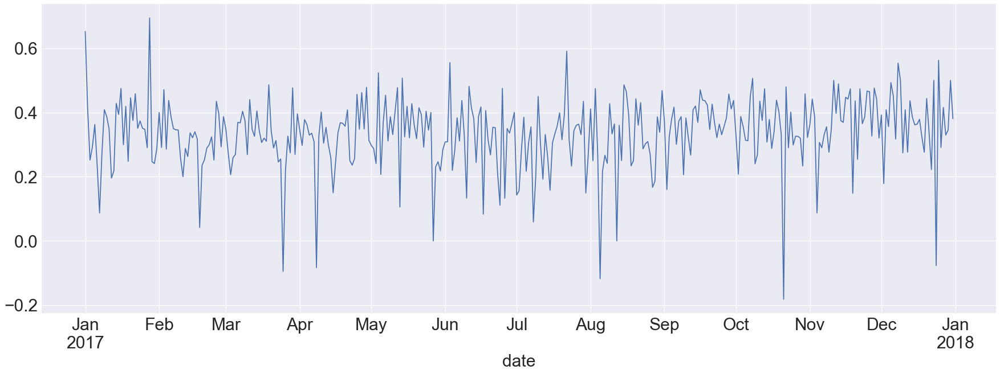

In [108]:
news.groupby(['date']).mean().sentiment.plot()

In [109]:
topic_id = ['0', '3', '5']
security = news[article_topics.loc[:,topic_id].sum(axis=1)>0]
# security['sentiment'] = security.polarity.map(lambda x: x if x==0 else x/abs(x) )

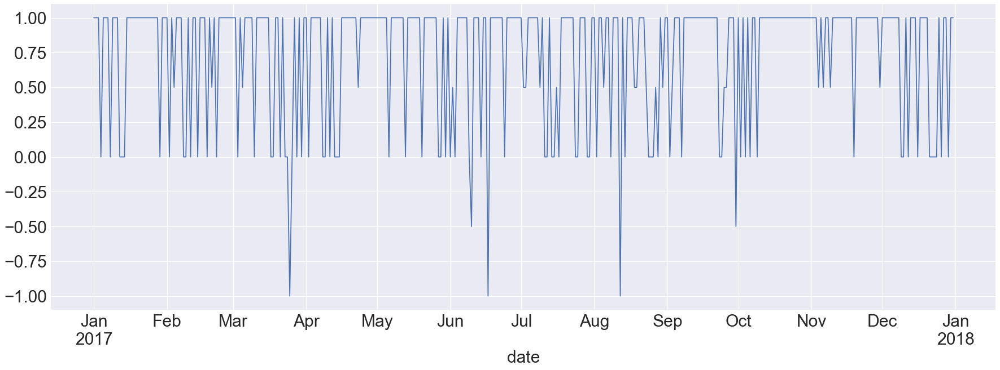

In [110]:
security.groupby(['date']).median().sentiment.plot()
# median shows the major polarity in the day

### News over the time

In [111]:
a = pd.DataFrame(news.date.value_counts(sort=False))

([<matplotlib.axis.XTick at 0x1141d41d0>,
 <a list of 7 Text xticklabel objects>)

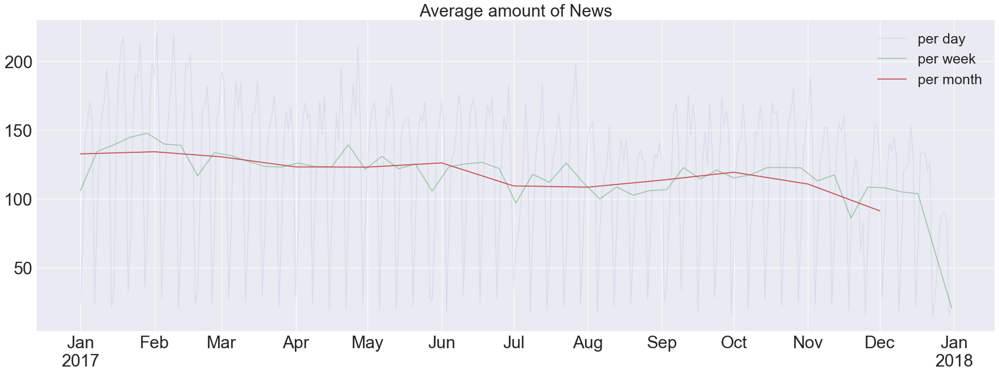

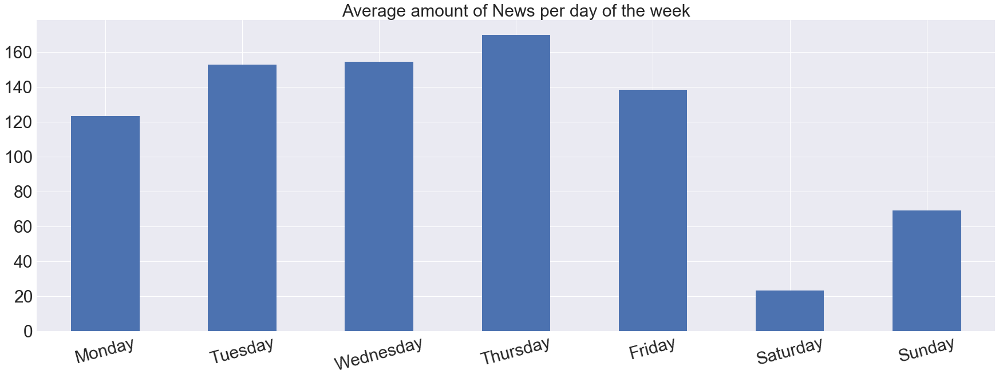

In [112]:
fig = figure()
ax = fig.add_subplot(111)
a.resample('1D').mean().plot(alpha=0.1, legend=False, title='Average amount of News', ax=ax)
a.resample('7D').mean().plot(alpha=0.5, legend=False, title='Average amount of News', ax=ax)
a.resample('1M').mean().plot(legend=False, title='Average amount of News', ax=ax)
ax.legend(['per day','per week','per month'])

figure()
a.groupby(a.index.dayofweek).mean().plot(kind='bar',
                                       legend=False,
                                       title='Average amount of News per day of the week',
                                      )
xticks(arange(7), ('Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'), rotation=15)

### Compare with BitCoin News

In [113]:
# BTC news
key_word= "([Bb]it[Cc]oin)|([Bb]lock[-]?chain)|([Hh]ack)"
b = news.content[news.content.str.contains(key_word)]
print(b.shape, '\n', b.sample(5))

/Users/domi/anaconda3/envs/py35/lib/python3.5/site-packages/ipykernel_launcher.py:3: UserWarning:

This pattern has match groups. To actually get the groups, use str.extract.



(486,) 
 2836     Yahoo Earnings: What to Watch Yahoo Inc. is sc...
39864    Recalls Mount During Ford’s Reinvention Push F...
40451    Uber Security Managers Resign After Hack, Surv...
42388    The A-hed Good News! You Are a Bitcoin Million...
31728    Exchanges Cite Hacking Risk of Planned Market-...
Name: content, dtype: object


In [114]:
# key_word= "([Bb]it[Cc]oin)|([Bb]lock[-]?chain)"
b = news[news.content.str.contains(key_word)]
# b = pd.DataFrame(b.date.value_counts(sort=False))

/Users/domi/anaconda3/envs/py35/lib/python3.5/site-packages/ipykernel_launcher.py:2: UserWarning:

This pattern has match groups. To actually get the groups, use str.extract.



In [115]:
b = pd.DataFrame(b.groupby('date').sum().polarity)

([<matplotlib.axis.XTick at 0x1220f3d30>,
 <a list of 7 Text xticklabel objects>)

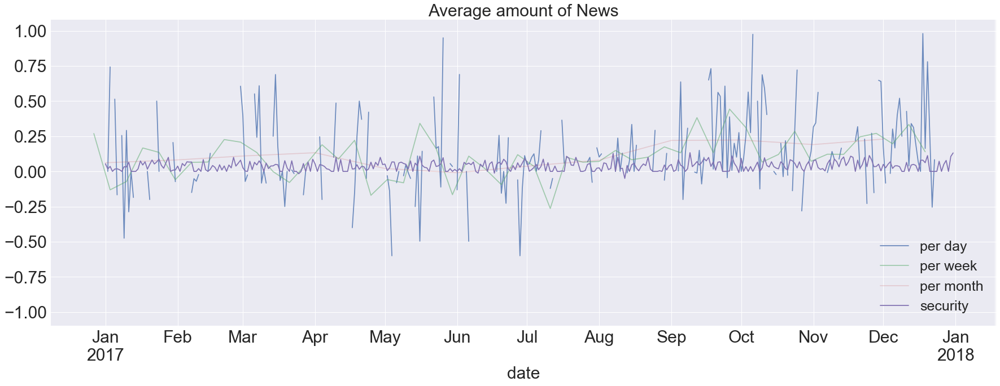

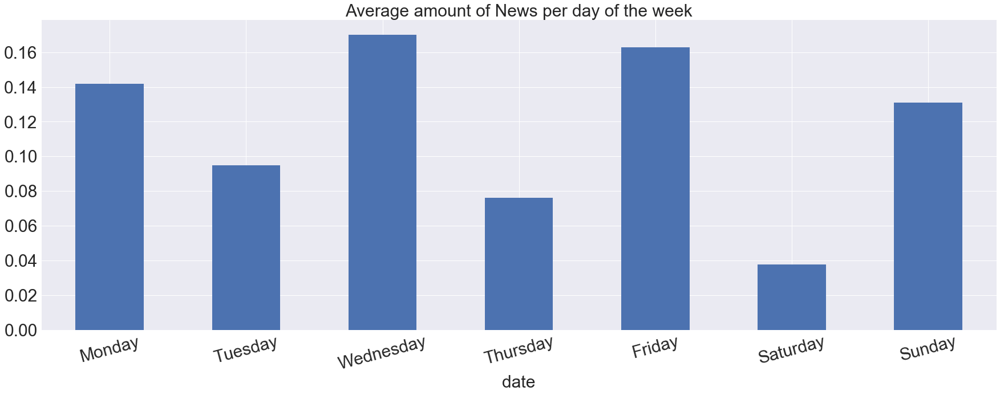

In [116]:
fig = figure()
ax = fig.add_subplot(111)
b.resample('1D').mean().plot(alpha=0.8, legend=False, title='Average amount of News', ax=ax)
b.resample('7D').mean().plot(alpha=0.5, legend=False, title='Average amount of News', ax=ax)
b.resample('1M').mean().plot(alpha = 0.2, legend=False, title='Average amount of News', ax=ax)

security.groupby('date').median().polarity.resample('1D').mean().plot(ax=ax)

ax.legend(['per day','per week','per month','security'])


figure()
b.groupby(b.index.dayofweek).mean().plot(kind='bar',
                                       legend=False,
                                       title='Average amount of News per day of the week',
                                      )

xticks(arange(7), ('Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'), rotation=15)

In [117]:
btc_2017 = btc_usd_datasets[(btc_usd_datasets.index >= start_date) & (btc_usd_datasets.index <= end_date )].loc[:, ['avg_btc_price_usd']]
btc_2017['vol'] = btc_vol_datasets[(btc_vol_datasets.index >= start_date) & (btc_vol_datasets.index <= end_date )].loc[:, ['tot_btc_vol_usd']]
btc_2017.columns = ['Price', 'Volume']

In [587]:
c = btc_2017.Price
d = btc_2017.Volume

([<matplotlib.axis.XTick at 0x117d687f0>,
 <a list of 7 Text xticklabel objects>)

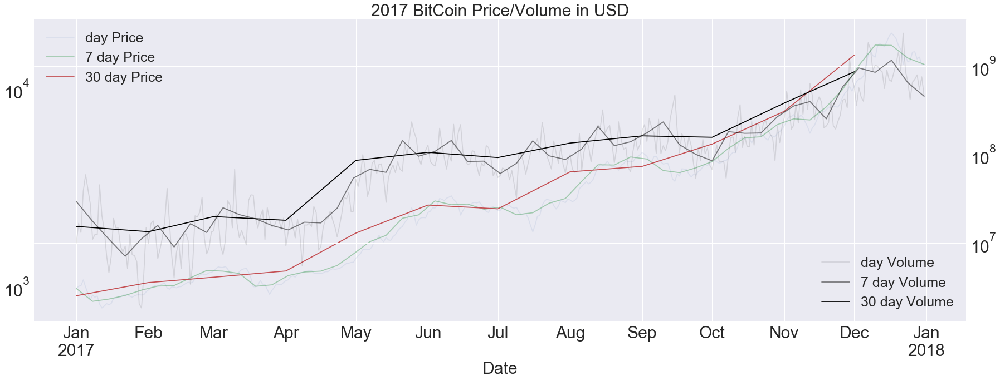

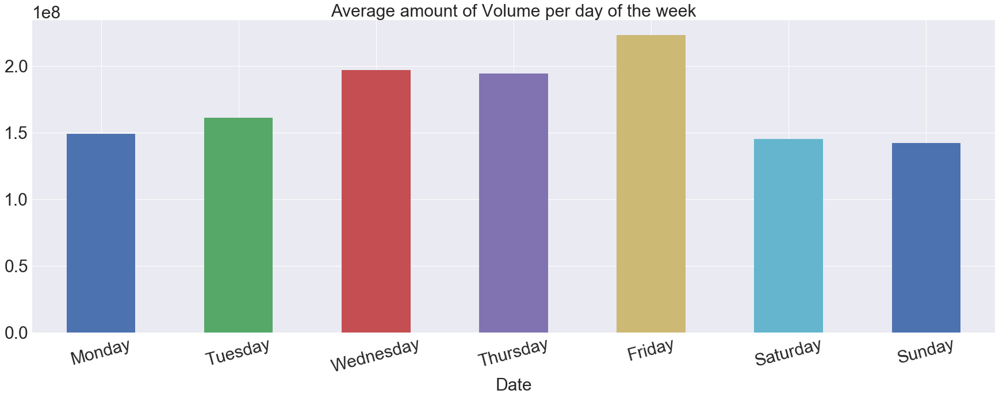

In [119]:
fig = figure()
ax = fig.add_subplot(111)
ax2 = ax.twinx()
c.resample('1D').mean().plot(alpha=0.1, legend=False, ax=ax)
c.resample('7D').mean().plot(alpha=0.5, legend=False, ax=ax)
c.resample('1M').mean().plot(legend=False, ax=ax)
ax.legend(['day Price','7 day Price','30 day Price'], loc=0)
ax.semilogy()

d.resample('1D').mean().plot(c='k', alpha=0.1, legend=False, ax=ax2)
d.resample('7D').mean().plot(c='k', alpha=0.5, legend=False, ax=ax2)
d.resample('1M').mean().plot(c='k', legend=False, ax=ax2)
ax2.legend(['day Volume','7 day Volume','30 day Volume'], loc=4)
ax2.semilogy()
title("2017 Bitcoin Price/Volume in USD")
# savefig('fig/BTC.jpeg', dpi=200, bbox_inches='tight')

figure()
d.groupby(d.index.dayofweek).mean().plot(kind='bar',
                                       legend=False,
                                       title='Average amount of Volume per day of the week',
                                      )
xticks(arange(7), ('Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'), rotation=15)

### Correlation with sentiment

In [120]:
def senti(df, method = 'mean', roll_win = 1, feat = 'sentiment'):
    if method == 'median':
        return df.groupby(['date']).median()[feat].rolling(roll_win).median()
    elif method == 'sum':
        return df.groupby(['date']).sum()[feat].rolling(roll_win).mean()
    else:
        return df.groupby(['date']).mean()[feat].rolling(roll_win).mean()

In [121]:
btc_2017.shape

(365, 2)

In [122]:
article_topics.shape

(43268, 32)

In [123]:
# final = pd.DataFrame()
# for t_id, t_name in topic_num_to_name.values:
# #     print(t_id, t_name)
#     topic_id = [t_id]
#     one_topic = news[article_topics.loc[:,topic_id].sum(axis=1)>0]
#     final[t_name] = senti(one_topic, feat='sentiment')
# final.replace(np.nan, 0, inplace=True)
# final.to_csv('data/tmp.gz', compression='gzip')
final = pd.read_csv('data/tmp.gz', index_col=0, parse_dates=['date'])
final.replace(np.nan, 0, inplace=True)

In [124]:
def corr(df1, df2):
    n = len(df1)
    v1, v2 = df1.values, df2.values
    sums = np.multiply.outer(v2.sum(0), v1.sum(0))
    stds = np.multiply.outer(v2.std(0), v1.std(0))
    return pd.DataFrame((v2.T.dot(v1) - sums / n) / stds / n,
                        df2.columns, df1.columns)

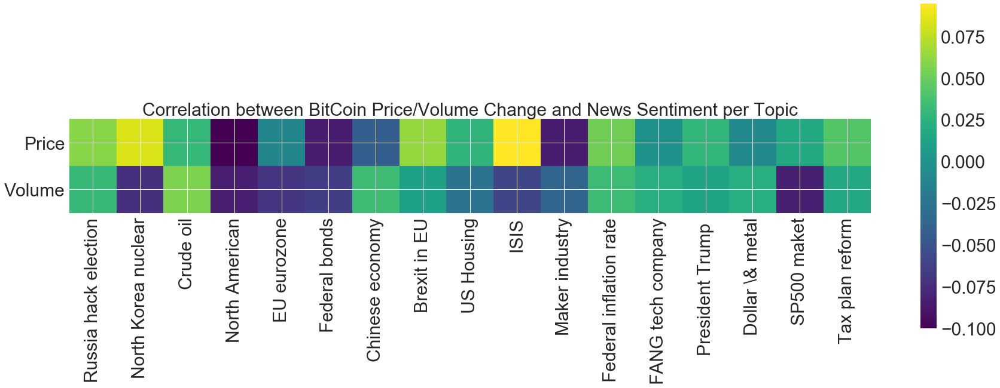

In [125]:
imshow(corr(final, btc_2017.pct_change().replace(np.nan, 0)), cmap='viridis')
colorbar()
yticks(arange(2), btc_2017.columns)
xticks(arange(17), final.columns, rotation=90)
title("Correlation between Bitcoin Price/Volume Change and News Sentiment per Topic")
# savefig("fig/corr.jpeg", dpi=200, bbox_inches='tight')

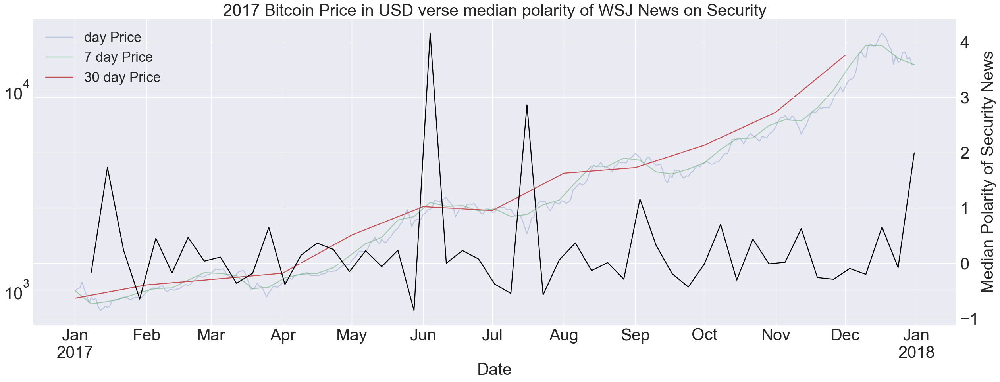

In [589]:
fig = figure()
ax = fig.add_subplot(111)
c.resample('1D').mean().plot(alpha=0.3, legend=False, ax=ax)
c.resample('7D').mean().plot(alpha=0.5, legend=False, ax=ax)
c.resample('1M').mean().plot(legend=False, ax=ax)
ax.legend(['day Price','7 day Price','30 day Price'], loc=0)
ax.semilogy()

# ylabel("Price in USD")
ax2 = ax.twinx()
security.groupby('date').median().polarity.resample('7D').mean().pct_change().plot(ax=ax2,c='k')
ylabel('Median Polarity of Security News')

# d.resample('1D').mean().plot(c='k', alpha=0.1, legend=False, ax=ax2)
# d.resample('7D').mean().plot(c='k', alpha=0.5, legend=False, ax=ax2)
# d.resample('1M').mean().plot(c='k', legend=False, ax=ax2)
# ax2.legend(['day Volume','7 day Volume','30 day Volume'], loc=4)
# ax2.semilogy()

title("2017 Bitcoin Price in USD verse median polarity of WSJ News on Security")
# savefig('fig/BTC_Polarity.jpeg', dpi=200, bbox_inches='tight')

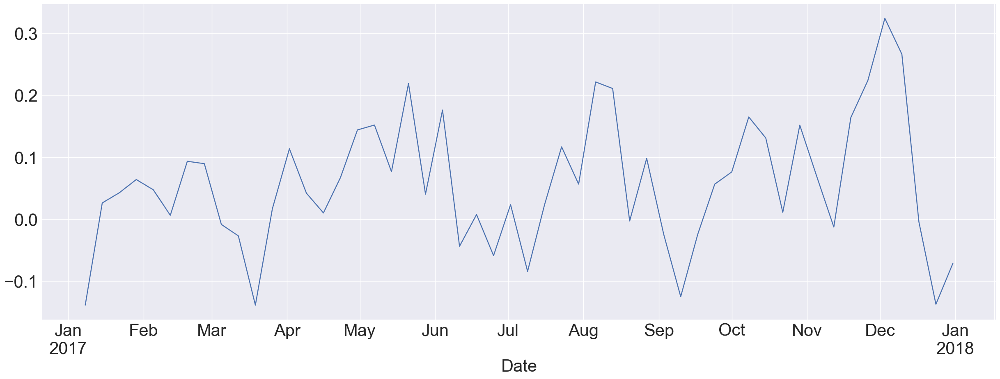

In [595]:
c.resample('7D').mean().pct_change().plot()
# vlines(c.index[(c.pct_change()) > 0.08], 0, c.max(), colors='r', alpha=0.5)
# vlines(c.index[(c.pct_change()) < -0.08], 0, c.max(), colors='g', alpha=0.5)
# vlines(mark.index[mark.values>0.12], 0, c.max(), colors='b')
# vlines(mark.index[mark.values<-0.03], 0, c.max(), colors='k')

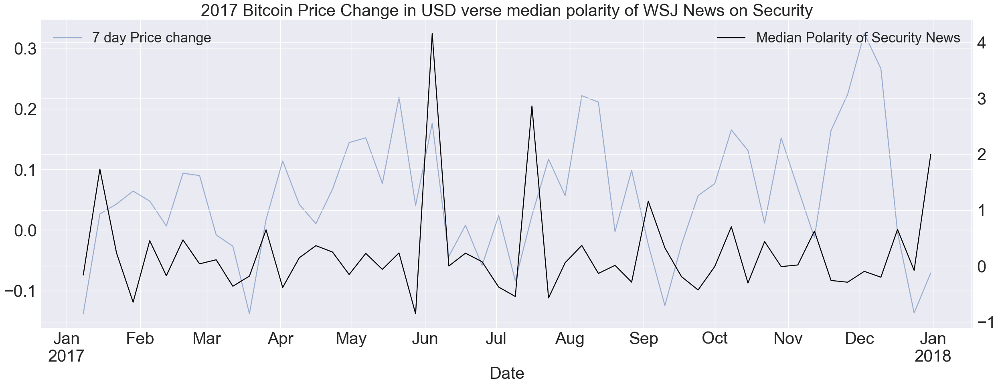

In [598]:
fig = figure()
ax = fig.add_subplot(111)
# c.resample('1D').mean().plot(alpha=0.3, legend=False, ax=ax)
c.resample('7D').mean().pct_change().plot(alpha=0.5, ax=ax)
# d.resample('7D').mean().pct_change().plot(alpha=0.5, ax=ax)
# c.resample('1M').mean().plot(legend=False, ax=ax)
ax.legend(['7 day Price change'], loc=0)
# ax.semilogy()

# ylabel("Price in USD")
ax2 = ax.twinx()
security.groupby('date').median().polarity.resample('7D').mean().pct_change().plot(ax=ax2,c='k')
ax2.legend(['Median Polarity of Security News'])

# d.resample('1D').mean().plot(c='k', alpha=0.1, legend=False, ax=ax2)
# d.resample('7D').mean().plot(c='k', alpha=0.5, legend=False, ax=ax2)
# d.resample('1M').mean().plot(c='k', legend=False, ax=ax2)
# ax2.legend(['day Volume','7 day Volume','30 day Volume'], loc=4)
# ax2.semilogy()

title("2017 Bitcoin Price Change in USD verse median polarity of WSJ News on Security")
# savefig('fig/BTC_change.jpeg', dpi=200, bbox_inches='tight')

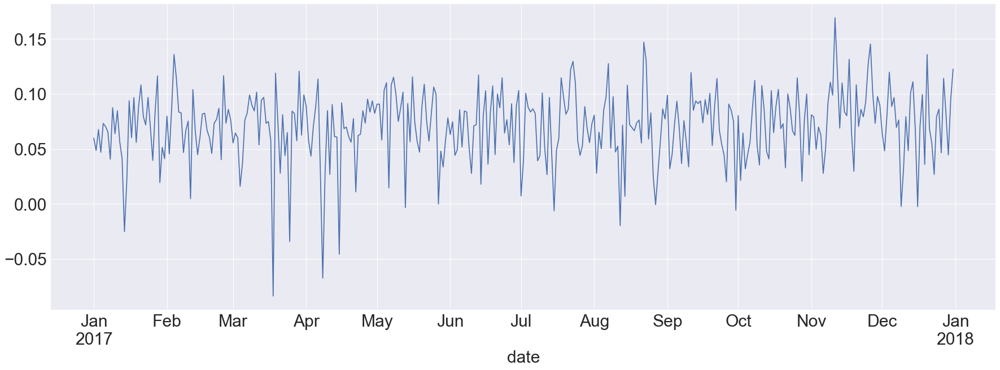

In [173]:
security.groupby('date').mean().polarity.plot()

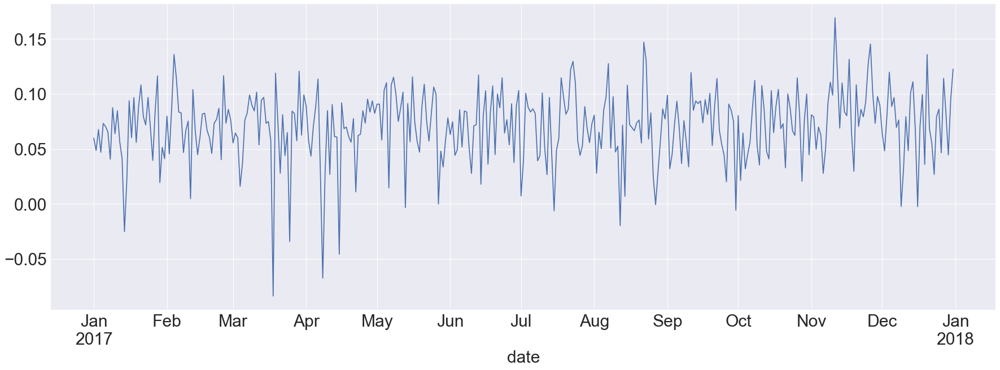

In [174]:
security.groupby('date').mean().polarity.plot()

In [583]:
# mark = security.groupby('date').median().sentiment.rolling(7)
mark = security.groupby('date').mean().polarity

In [189]:
key_word= "([Bb]it[Cc]oin)|([Bb]lock[-]?chain)|([Cc]rypto[-]?curren)"
b = news[news.content.str.contains(key_word)]

/Users/domi/anaconda3/envs/py35/lib/python3.5/site-packages/ipykernel_launcher.py:2: UserWarning:

This pattern has match groups. To actually get the groups, use str.extract.



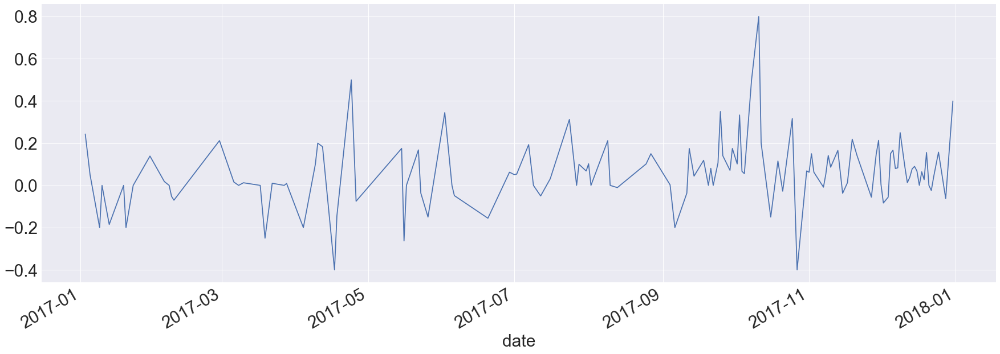

In [222]:
b.groupby('date').mean().polarity.plot()

In [261]:
mark = pytrends.interest_over_time()[pytrends.interest_over_time().index.isin(c.index)]

In [274]:
c= c.rolling(7).mean()

/Users/domi/anaconda3/envs/py35/lib/python3.5/site-packages/matplotlib/scale.py:111: RuntimeWarning:

invalid value encountered in less_equal



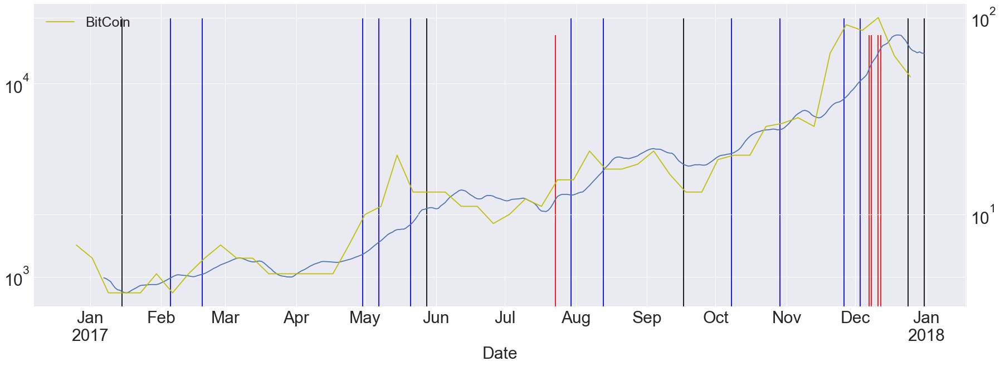

In [277]:
ax = figure().add_subplot(111)
c.plot(logy=True, ax=ax)
vlines(c.index[(c.pct_change()) > 0.05], 0, c.max(), colors='r')
vlines(c.index[(c.pct_change()) < -0.05], 0, c.max(), colors='g')
vlines(mark.index[mark.BitCoin.pct_change() > 0.2] , 0, c.max(), colors='b')
vlines(mark.index[mark.BitCoin.pct_change() < -0.2], 0, c.max(), colors='k')
ax2 = ax.twinx()
mark.plot(c='y', logy=True, ax=ax2)

In [600]:
kw_list = ["BitCoin"]
pytrends.build_payload(kw_list, cat=0, timeframe='today 5-y', geo='', gprop='')

In [601]:
btc_trend = pytrends.interest_over_time()[pytrends.interest_over_time().index.isin(c.index)]

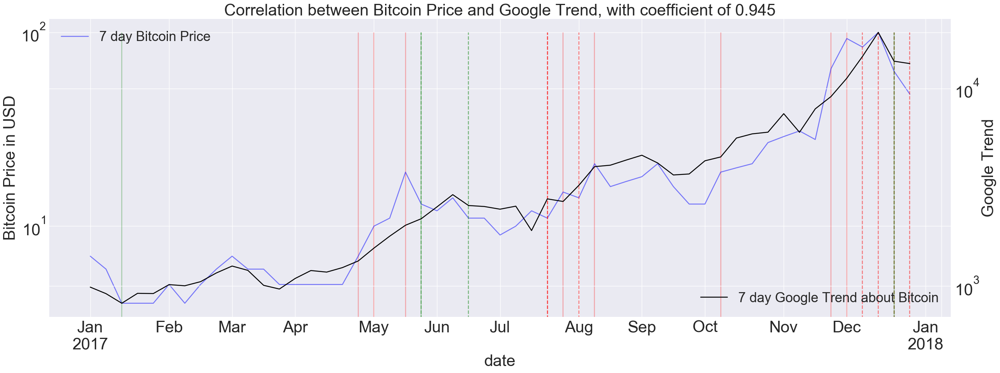

In [622]:
ax = figure().add_subplot(111)

title("Correlation between Bitcoin Price and Google Trend, with coefficient of 0.945")
btc_trend.plot(logy=True, c='b', alpha=0.5, ax=ax)
vlines(btc_trend.index[btc_trend.BitCoin.pct_change()>0.3] , 0, btc_trend.BitCoin.max(), 
       alpha=0.3, colors='r')
vlines(btc_trend.index[btc_trend.BitCoin.pct_change()<-0.3] , 0, btc_trend.BitCoin.max(), 
       alpha=0.3, colors='g')
ax.legend(['7 day Bitcoin Price'])
ylabel('Bitcoin Price in USD')
ax2 = ax.twinx()
c.plot(logy=True, ax=ax2, c='k')
ylabel('Google Trend')
ax2.legend(['7 day Google Trend about Bitcoin'], loc=4)
vlines(c.index[(c.pct_change()) > 0.1], 0, c.max(), 
       alpha=0.5, linestyles='dashed', colors='r')
vlines(c.index[(c.pct_change()) < -0.1], 0, c.max(), 
       alpha=0.5, linestyles='dashed', colors='g')
savefig('fig/google.jpeg', dpi=200, bbox_inches='tight')

In [321]:
pd.concat([btc_trend.BitCoin, btc_2017.loc[btc_trend.index, :]],axis=1).corr()

,BitCoin,Price,Volume
BitCoin,1.000000,0.945498,0.915499
Price,0.945498,1.000000,0.899519
Volume,0.915499,0.899519,1.000000


In [206]:
c.index[(c.pct_change() > 0) & (security.groupby('date').median().sentiment > 0 )] 

DatetimeIndex(['2017-01-02', '2017-01-03', '2017-01-10', '2017-01-16',
               '2017-01-17', '2017-01-19', '2017-01-20', '2017-01-21',
               '2017-01-22', '2017-01-23',
               ...
               '2017-12-05', '2017-12-06', '2017-12-07', '2017-12-08',
               '2017-12-11', '2017-12-15', '2017-12-17', '2017-12-25',
               '2017-12-27', '2017-12-31'],
              dtype='datetime64[ns]', name='Date', length=177, freq=None)

In [209]:
c.index[(c.pct_change() < 0) & (security.groupby('date').median().sentiment > 0 )] 

DatetimeIndex(['2017-01-05', '2017-01-06', '2017-01-07', '2017-01-09',
               '2017-01-11', '2017-01-15', '2017-01-18', '2017-01-24',
               '2017-01-25', '2017-02-05',
               ...
               '2017-11-23', '2017-11-24', '2017-11-30', '2017-12-13',
               '2017-12-14', '2017-12-18', '2017-12-19', '2017-12-20',
               '2017-12-28', '2017-12-30'],
              dtype='datetime64[ns]', name='Date', length=106, freq=None)

(array([  1.,   1.,  90.,  53.,  54.,  67.,  51.,  25.,  20.,   3.]),
 array([-0.05      , -0.03166667, -0.01333333,  0.005     ,  0.02333333,
         0.04166667,  0.06      ,  0.07833333,  0.09666667,  0.115     ,
         0.13333333]),
 <a list of 10 Patch objects>)

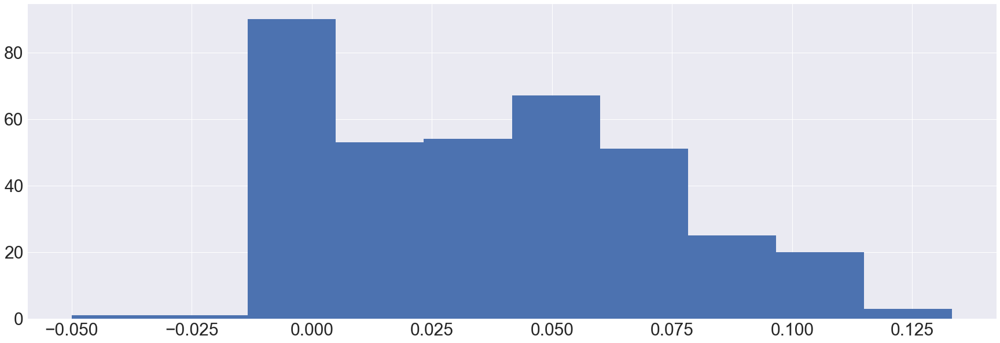

In [217]:
hist(security.groupby('date').median().polarity)

### Doc2Vec on News

[Doc2Vec brief](https://medium.com/scaleabout/a-gentle-introduction-to-doc2vec-db3e8c0cce5e)

Word vector
* [pretrained wiki & associated press](https://github.com/jhlau/doc2vec)


Corpus
* established
    * [nltk](http://www.nltk.org/nltk_data/)
    * [wiki](https://radimrehurek.com/gensim/wiki.html)
    
* customized
    * [google news archive](https://news.google.com/newspapers)
    * [news API](https://newsapi.org/docs)
	* [wsj news archive](http://www.wsj.com/public/page/archive-2018-1-03.html)
	* [google trends](https://trends.google.com/trends/)
	* [intrinio](http://blog.intrinio.com/news-api-get-latest-news-stocks/)
    

[codecs.open()](https://docs.python.org/2/library/codecs.html):  Open an encoded file using the given mode and return a wrapped version providing transparent encoding/decoding. 

[word2vec vs doc2vec](https://www.quora.com/What-is-doc2vec):
* While Word2Vec computes a feature vector for every word in the corpus, Doc2Vec computes a feature vector for every document in the corpus.
* While Word2Vec works on the intuition that the word representation should be good enough to predict the surrounding words, the underlying intuition of Doc2Vec is that the document representation should be good enough to predict the words in the document.

* Distributed Bag of Words and The skip gram model. One involves predicting the context words using a centre word, while the other involves predicting the word using the context words. 


[Resources: DL4J](https://deeplearning4j.org/word2vec.html#doc2vec--other-nlp-resources)

In [123]:
wiki300 = pd.read_csv('data/wiki_vec300.gz', sep=' ', header=None)
ap300 = pd.read_csv('data/apnews_vec300.gz', sep=' ', header=None)

In [124]:
print(wiki300.shape, ap300.shape)

(43268, 300) (43268, 300)


In [547]:
# explore the correlation between the news
def corr_heatmap(df, n=100, random=True, absolute_bounds=True):
    '''Plot a correlation heatmap for the entire dataframe'''
    if random:
        heatmap = go.Heatmap(
            z=df.sample(n).T.corr(method='pearson').as_matrix(),
            x=df.columns,
            y=df.columns,
            colorbar=dict(title='Pearson Coefficient'),
        )
    
    else:
        heatmap = go.Heatmap(
            z=df.head(n).T.corr(method='pearson').as_matrix(),
            x=df.columns,
            y=df.columns,
            colorbar=dict(title='Pearson Coefficient'),
        )
    
    layout = go.Layout(title='Pearson Correlation')
    
    if absolute_bounds:
        heatmap['zmax'] = 1.0
        heatmap['zmin'] = -1.0
        
    fig = go.Figure(data=[heatmap], layout=layout)
    py.iplot(fig)    

In [126]:
# # compare how representative the vector size will be

# vec30 = pd.read_csv('data/cache/wsj_vec30.gz', sep=' ', header=None)
# vec60 = pd.read_csv('data/cache/wsj_vec60.gz', sep=' ', header=None)
# vec300 = pd.read_csv('data/cache/wiki_vec300.gz', sep=' ', header=None)
# vec30_corr = vec30.corr()
# vec60_corr = vec60.corr()
# vec300_corr = vec300.corr()

In [127]:
# fig = figure(figsize=(18,6))
# ax1 = fig.add_subplot(1,3,1)
# ax1.imshow(vec30_corr, cmap='viridis')
# pct = (np.count_nonzero(np.where(vec30_corr>0.5)[0])-29)/(30*30-30)*100
# ax1.set_title('Correlated Feature Pairs: %0.2f%%' % pct)

# ax2 = fig.add_subplot(1,3,2)
# ax2.imshow(vec60_corr, cmap='viridis')
# pct = (np.count_nonzero(np.where(vec60_corr>0.5)[0])-59)/(60*60-60)*100
# ax2.set_title('Correlated Feature Pairs: %0.2f%%' % pct)

# ax3 = fig.add_subplot(1,3,3)
# ax3.imshow(vec300_corr, cmap='viridis')
# pct = (np.count_nonzero(np.where(vec300_corr>0.5)[0])-299)/(300*300-300)*100
# ax3.set_title('Correlated Feature Pairs: %0.2f%%' % pct)

# # savefig('fig/feature_dim.jpeg', dpi=200, bbox_inches='tight')

In [128]:
# n = 300
# vec30_Tcorr = vec30.head(n).T.corr()
# vec60_Tcorr = vec60.head(n).T.corr()
# vec300_Tcorr = vec300.head(n).T.corr()

In [129]:
# fig = figure(figsize=(18,6))
# ax1 = fig.add_subplot(1,3,1)

# im = ax1.imshow(vec30_Tcorr, cmap='plasma')
# pct = (np.count_nonzero(np.where(vec30_Tcorr<0.5)[0])-n+1)/n/(n-1)*100
# ax1.set_title('Uncorrelated News: %0.2f%%' % pct)

# ax2 = fig.add_subplot(1,3,2)
# im = ax2.imshow(vec60_Tcorr, cmap='plasma')
# pct = (np.count_nonzero(np.where(vec60_Tcorr<0.5)[0])-n+1)/n/(n-1)*100
# ax2.set_title('Uncorrelated News: %0.2f%%' % pct)

# ax3 = fig.add_subplot(1,3,3)
# im = ax3.imshow(vec300_Tcorr, cmap='plasma')
# pct = (np.count_nonzero(np.where(vec300_Tcorr<0.5)[0])-n+1)/n/(n-1)*100
# ax3.set_title('Uncorrelated News: %0.2f%%' % pct)

# fig.colorbar(im, ax =[ax1, ax2, ax3])#, orientation='horizontal', aspect=50)

# # savefig('fig/feature_detail.jpeg', dpi=200, bbox_inches='tight')

In [130]:
# # calculate distance 
# from scipy.spatial.distance import pdist, squareform

# distances = pdist(vec30.head(300).values, metric='euclidean')
# dist_matrix = squareform(distances)

#### Inspect News from correlation map

In [131]:
# heatmap for explore
corr_heatmap(wiki300, n=300, random=False)
# similar news will have higher correlation and unlike news will have lower correlation
# the strips means that news almost have no correlation with all others. 
# Upon close check, these are the general topics, i.e. 52, 94, 230

In [132]:
wiki_Tcorr = wiki300.head(300).T.corr()

In [133]:
pd.options.display.max_colwidth = 200

In [134]:
# unlike pairs
mask = (wiki_Tcorr < 0.1) # & (wiki_Tcorr > 0.13)
pairs = np.where(mask)
# Counter(pairs[0])

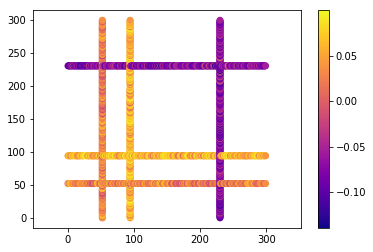

In [135]:
scatter(pairs[0], pairs[1], c=wiki_Tcorr.values[mask], cmap='plasma')#, vmax=1)
axis('equal')
xlim([0,300])
colorbar()

In [136]:
ind = 2
print(pairs[0][ind], '\t', news.content[pairs[0][ind]])
print(pairs[1][ind], '\t', news.content[pairs[1][ind]])

0 	 Europe’s Fate in 2017: Caught Between Low Rates and Populist Politics For Europe in 2017, the big question is whether fragile economic growth and unprecedented central-bank stimulus will be overtaken by populist politics.
230 	 Pepper...and Salt Pepper...and Salt


In [137]:
for ind, n in Counter(pairs[0]).most_common(4):
    print('news id:', ind ,'\t' ,n ,'times','\t' , news.content[ind])

news id: 230 	 299 times 	 Pepper...and Salt Pepper...and Salt
news id: 52 	 297 times 	 What’s News: World-Wide What’s News: World-Wide
news id: 94 	 266 times 	 Business Watch Business Watch
news id: 0 	 3 times 	 Europe’s Fate in 2017: Caught Between Low Rates and Populist Politics For Europe in 2017, the big question is whether fragile economic growth and unprecedented central-bank stimulus will be overtaken by populist politics.


In [138]:
# like pairs
like_mask = (wiki_Tcorr<1) & (wiki_Tcorr>0.9)
like_pairs = np.where(like_mask)
Counter(like_pairs[0])

Counter({13: 1,
         86: 1,
         92: 1,
         95: 1,
         124: 1,
         137: 1,
         155: 1,
         177: 1,
         212: 1,
         262: 1})

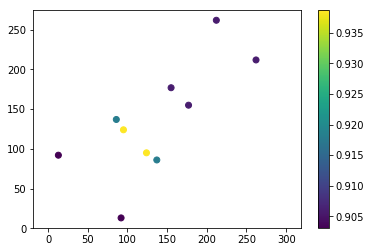

In [139]:
scatter(like_pairs[0], like_pairs[1], c=wiki_Tcorr.values[like_mask])#, vmin=min(wiki_Tcorr.min()))
axis('equal')
xlim([0,300])
colorbar()

In [140]:
ind = 1
print(like_pairs[0][ind], '\t', news.content[like_pairs[0][ind]])
print(like_pairs[1][ind], '\t', news.content[like_pairs[1][ind]])

86 	 Brazil Prison Riot Leaves Scores Dead A fight between rival drug gangs sparked a prison riot that left about 60 inmates dead in the Brazilian city of Manaus, according to local authorities.
137 	 Brazil Hunts for Scores of Escaped Inmates More than 130 escaped prisoners in Brazil were on the run Tuesday after breaking out during a bloody prison riot that left 60 inmates dead and sparked criticism of chronic overcrowding in the country’s jails.


In [141]:
# very good representation

Text(0.5,1,'Pearson Correlation bewteen first 300 News')

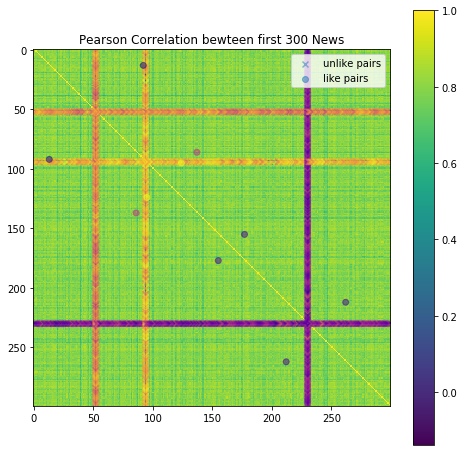

In [154]:
# Heatmap for save 
figure(figsize=(8,8))
scatter(pairs[0], pairs[1], marker='x', alpha=0.5, c=wiki_Tcorr.values[mask], cmap='plasma')#, vmax=1)
scatter(like_pairs[0], like_pairs[1], marker='o', facecolors=None, alpha=0.5, c=wiki_Tcorr.values[like_mask], cmap='plasma')#, vmin=min(wiki_Tcorr.min()))
legend(['unlike pairs','like pairs'], loc=1)
imshow(wiki_Tcorr)
colorbar()
title("Pearson Correlation bewteen first 300 News")
# savefig('fig/wiki300.jpeg', dpi=200, bbox_inches='tight')

TFIDF model: not that good

In [507]:
n=300
tfidf_Tcorr = transformed_data.head(n).T.corr()

In [574]:
# unlike pairs
mask = (tfidf_Tcorr < 0.1)  & (tfidf_Tcorr > -0.1)
pairs = np.where(mask)
# Counter(pairs[0])

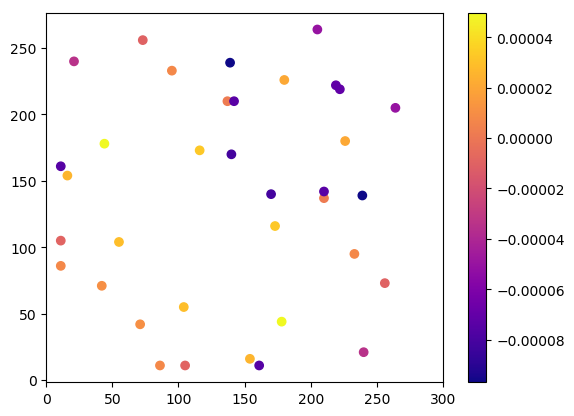

In [567]:
scatter(pairs[0], pairs[1], c=tfidf_Tcorr.values[mask], cmap='plasma')#, vmax=1)
axis('equal')
xlim([0,300])
colorbar()

In [582]:
ind = 5000
print(pairs[0][ind], '\t', news.content[pairs[0][ind]])
print(pairs[1][ind], '\t', news.content[pairs[1][ind]])

23 	 Riders and Residents Greet Second Avenue Subway’s Opening The new Second Avenue Subway was greeted on Monday by Upper East Side residents who welcomed the end of construction and riders who looked forward to easier, less-congested commutes.
119 	 Alcoa to Permanently Close Suriname Alumina Refinery and Bauxite Mines Alcoa will permanently close the Suralco alumina refinery and bauxite mines in Suriname, which were fully curtailed in November 2015 amid a limited bauxite supply and unfavorable market conditions.


In [576]:
for ind, n in Counter(pairs[0]).most_common(4):
    print('news id:', ind ,'\t' ,n ,'times','\t' , news.content[ind])

news id: 21 	 288 times 	 North Korea Close to Intercontinental Missile Test Kim Jong Un said his country is finalizing preparations for a test launch of an ICBM, which would mark an advance in its attempt to build a nuclear weapon capable of reaching the U.S.
news id: 193 	 287 times 	 A Mediterranean-Style Villa in Larchmont, N.Y. This 1920s stone house has an original tile roof and a solarium.
news id: 231 	 287 times 	 The 10-Point: Gerard Baker on Republicans Taking the Reins, Luxury Rents, Retirement Plans and More A personal, guided tour to the best scoops and stories every day in The Wall Street Journal, from Editor in Chief Gerard Baker.
news id: 259 	 286 times 	 The 10-Point: Gerard Baker on a House Divided and United, Trump’s Car Clashes and More A personal, guided tour to the best scoops and stories every day in The Wall Street Journal, from Editor in Chief Gerard Baker.


In [536]:
# like pairs
like_mask = (tfidf_Tcorr<1) & (tfidf_Tcorr>0.99)
like_pairs = np.where(like_mask)
# Counter(like_pairs[0])

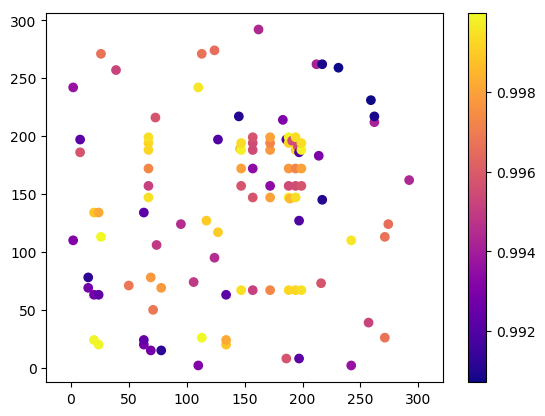

In [537]:
scatter(like_pairs[0], like_pairs[1], c=tfidf_Tcorr.values[like_mask], cmap='plasma')#, vmax=1)
axis('equal')
xlim([0,300])
colorbar()

In [544]:
ind = 2
print(like_pairs[0][ind], '\t', news.content[like_pairs[0][ind]])
print(like_pairs[1][ind], '\t', news.content[like_pairs[1][ind]])

8 	 China Tries to Recalibrate Credit Chinese officials need to tread carefully in the coming months to tighten monetary conditions, curb risky investment practices and keep the yuan from depreciating too far while keeping China’s economy healthy.
186 	 Boutique Hotels Bet on China Even as Nation’s Glut of Rooms Worsens Flashy hotels targeting the young and hip see opportunity in China even as the country is experiencing an overall glut of hotels that has reduced average room rates.


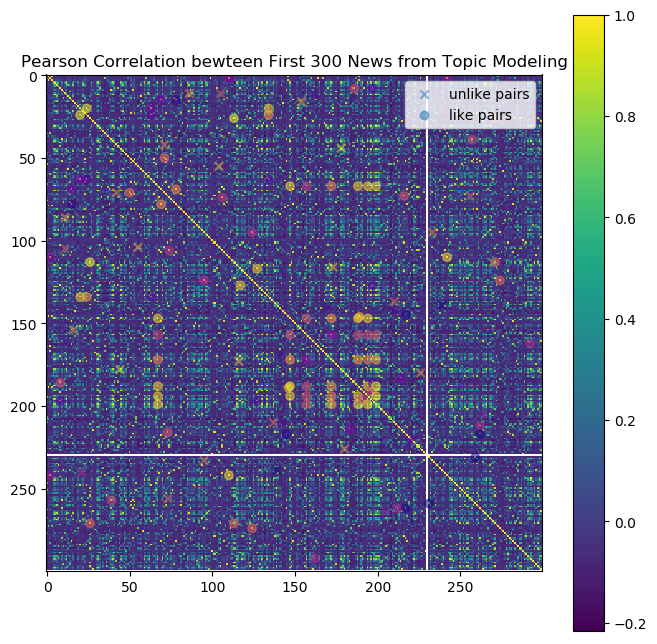

In [570]:
# Heatmap for save 
figure(figsize=(8,8))
scatter(pairs[0], pairs[1], marker='x', alpha=0.5, c=tfidf_Tcorr.values[mask], cmap='plasma')#, vmax=1)
scatter(like_pairs[0], like_pairs[1], marker='o', facecolors=None, alpha=0.5, c=tfidf_Tcorr.values[like_mask], cmap='plasma')#, vmin=min(wiki_Tcorr.min()))
legend(['unlike pairs','like pairs'], loc=1)
imshow(tfidf_Tcorr, cmap='viridis')
colorbar()
title("Pearson Correlation bewteen First 300 News from Topic Modeling")
savefig('fig/tfidf.jpeg', dpi=200, bbox_inches='tight')

### Retopics

In [144]:
from sklearn.decomposition import PCA

In [145]:
%time m_pca = PCA(n_components=30, random_state=1).fit(wiki300)
%time pca_transformed_data = m_pca.transform(wiki300)
pca_transformed_data = pd.DataFrame(pca_transformed_data)
scores = m_pca.score_samples(wiki300)
print("pca_transformed_data.shape", pca_transformed_data.shape)

CPU times: user 2 s, sys: 431 ms, total: 2.43 s
Wall time: 1.56 s
CPU times: user 174 ms, sys: 21.5 ms, total: 196 ms
Wall time: 129 ms
transformed_data.shape (43268, 30)


In [152]:
pca_topics = pd.DataFrame(scores.round() % 30)
pca_topics.columns = ["Topic_Num"]
pca_topics["Date"] = news.date

In [153]:
topic_id = [0]
news.content[pca_topics.Topic_Num == topic_id].sample(5)

21509    Seven U.S. Sailors Missing After Navy Destroyer Collides With Ship A U.S. destroyer severely damaged in a collision with a cargo vessel off the coast of Japan reached port as the Japanese and U.S....
9048     The Grand Piano: More Than a Nouveau-Riche Cliché Don’t dismiss the poor instrument—hijacked by the nouveau riche to expediently telegraph status and taste. Its inherent beauty shines even brighte...
24554    Lawmakers Can Spend Campaign Cash on Home Security, Agency Says Following a shooting in June that critically injured a senior House Republican, lawmakers may spend campaign funds on home security ...
30229    Returning Lawmakers Face a Tough Agenda With Little Margin for Error After a summer recess, Congress must grapple with keeping the federal government open, paying U.S. creditors and passing a hurr...
19130    Trump Looks to Get Past ‘Side Issues’ President Trump met privately with top advisers as he considered changes aimed at resetting the direction of an admin

### Explore Results

1. unsupervised
    1. DBSCAN: mark outlier
    2. ~~MeanShift: determine number of topics, slow~~

2. dimension reduction 
    1. PCA
3. classification
    1. TSNE: get labels
4. remove features
    1. RF: feature importance
    
5. verification
    1. KNN: train to predict on other news
    2. MLP
    3. GP

### Procedure
1. build word vector from established corpus
2. vectorize wsj news using word vector
3. ~~KNN to classify topics/PCA to identify topics~~
4. build panic metrics (disaster…), sentiment analysis
5. check correlation with precentage change in cryptocurrency

or
1. load established word vector
2. doc2vec training on news corpus
3. infer on wsj archived news
4. ~~KNN to check topic separation~~
5. build panic metrics (disaster…), sentiment analysis
6. check correlation with precentage change in cryptocurrency

In [132]:
from hdbscan import HDBSCAN
from sklearn.decomposition import PCA
from sklearn.cluster import estimate_bandwidth, MeanShift
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.manifold import TSNE

In [133]:
def exam(X, label, params=dict()):
    try:
        scatter(X.loc[:,0], X.loc[:,1], c=label, **params)
        colorbar()
    except:
        scatter(X[:,0], X[:,1], c=label, **params)
        colorbar()
    return

In [134]:
# parameters
n = 10000 # wiki300.shape[0]
dim = 10
plot_param = dict({'alpha': 0.5 , 's': 10 , 'cmap':cm.Accent})

In [135]:
# data
X = wiki300.head(n)
y = pd.read_csv('data/sentiment.gz').head(n)
y_DB = np.load('y_DB.temp.npy')[:n]
# y_MS = np.load('y_MS.temp.npy')[:n]

In [136]:
# 1.A
# m_DB = hdbscan.HDBSCAN()
# %time y_DB = m_DB.fit_predict(X)
Counter(y_DB)

Counter({-1: 6212, 0: 3785, 1: 3})

In [137]:
# mask data
mask = (y_DB == -1) | (y_DB == 0)

In [138]:
# news.content.head(n)[y_DB==1]

In [139]:
# news.content.head(n)[y_DB==3]

In [140]:
news.content.head(n)[y_DB==-1].sample(2)

719    Trump, Transition Team Won’t Meet With Taiwanese President During U.S. Visits An official with President-elect Donald Trump’s transition team said neither Mr. Trump nor transition officials would ...
721    Shopping for Vintage Fashion: How the Internet Has Transformed It A guide to navigating the online vintage marketplace—a far cry from the dusty basement boutiques of old—and hunting down historic ...
Name: content, dtype: object

In [141]:
news.content.head(n)[y_DB==0].sample(2)

2676                                                                                                                                 Greater New York Watch A roundup of news from across the tri-state region.
7551    What Would a Le Pen Victory in France Mean for the Euro? National Front candidate Marine Le Pen has said she would pull her country, one of the European Union’s founding nations, out of the common...
Name: content, dtype: object

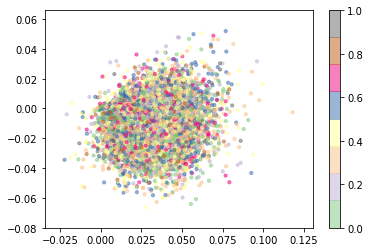

In [142]:
exam(X, y.subjectivity, plot_param)

In [143]:
# # 1.B
# %time m_MS = MeanShift(estimate_bandwidth(X[mask], quantile=0.2, n_samples=500))
# %time y_MS = m_MS.fit_predict(X[mask], y=news.subjectivity[mask])
# len(unique(y_MS))

In [144]:
# Counter(y_MS).most_common(10)

In [145]:
mask = (y.subjectivity>0) & mask

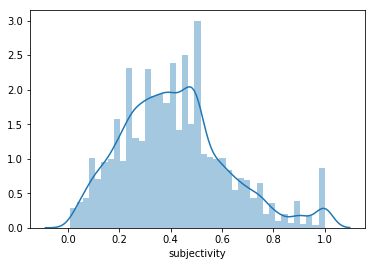

In [146]:
sns.distplot(y.subjectivity[mask])

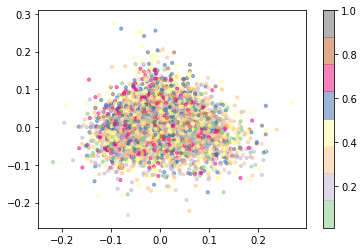

In [147]:
# 2.A reduce dimension
m_pca = PCA(n_components=dim)
X_pca = m_pca.fit_transform(X[mask], y.subjectivity[mask])
exam(X_pca[:,[1,2]], y.subjectivity[mask], plot_param)

In [148]:
_ = np.column_stack([X_pca, y.subjectivity[mask].values])
reduced = pd.DataFrame(_, columns=[str(i) for i in range(dim+1)])
# sns.pairplot(data=,
#              vars=[str(i) for i in range(dim)], hue='%d' % dim)

In [149]:
# sns.pairplot(reduced.sample(100), vars=['0','1','2'], hue='3')

In [352]:
# m_pca = PCA(n_components=dim)

# m_tsne = TSNE(n_components=3)

# # supervised
# m_RF = RandomForestClassifier()
# m_KNN = KNeighborsClassifier(n_neighbors=dim)

# m_MLP = MLPClassifier()
# m_GP = GaussianProcessClassifier()

# # unsupervised, fit_predict labels
# m_DB = DBSCAN(min_samples=10) # DBSCAN: mark outliers
# m_MS = MeanShift(estimate_bandwidth(X))


# y_DB = m_DB.fit_predict(X)
# Counter(y_DB)

# y_MS = m_MS.fit_predict(X)
# Counter(y_MS)

# exam(X, y_DB)

# exam(X, y_MS)

# X_pca = m_pca.fit_transform(X)
# exam(X_pca, y_MS)

# X_tsne = m_tsne.fit_transform(X)

# exam(X_tsne[:,[1,2]], y_MS)

[correlation matrxi visualization](https://datascience.stackexchange.com/questions/10459/calculation-and-visualization-of-correlation-matrix-with-pandas)
![](https://i.stack.imgur.com/ZmIpq.png)

### Explore the Doc2Vec model

In [324]:
import gensim.models as g
import codecs, gzip

Using TensorFlow backend.


In [325]:
news_split = [ x.strip().split() for x in codecs.getreader('utf-8')(gzip.open('data/wsj_content.gz'), errors='replace') ]

In [326]:
wsj30 = 'model/model30-10.bin'
wsj60 = 'model/model60-15.bin'
wiki_m = '/Users/domi/Desktop/wordvector/enwiki_dbow/doc2vec.bin'
ap_m = '/Users/domi/Desktop/wordvector/apnews_dbow/doc2vec.bin'

In [327]:
m = g.Doc2Vec.load(wiki_m)

In [328]:
m.corpus_count

35556952

In [329]:
len(m.wv.vocab)

669549

In [330]:
m.docvecs.count

35556952

In [331]:
m.vector_size

300

In [348]:
m.wv.similar_by_word('bitcoin')

[('bitcoins', 0.8329067826271057),
 ('cryptocurrency', 0.7802186012268066),
 ('cryptocurrencies', 0.7171971797943115),
 ('blockchain', 0.6623573899269104),
 ('litecoin', 0.6533896327018738),
 ('proof-of-work', 0.6183663606643677),
 ('dogecoin', 0.6171879172325134),
 ('coinbase', 0.6124340891838074),
 ('paypal', 0.6120955944061279),
 ('peercoin', 0.5889361500740051)]

In [332]:
ind = 1
news.content[ind]

'Photos of the Day: Jan. 1 In photos chosen Sunday by Wall Street Journal editors, Turks mourn after an attack at a nightclub, New York extends one of its subway lines, and more.'

In [333]:
news_split[ind] == news.content[ind].split()

True

In [334]:
vec = m.infer_vector(news_split[ind])
vec.shape

(300,)

In [335]:
m.wv.similar_by_vector(vec)

[('mourn', 0.4771307706832886),
 ('subway', 0.47003185749053955),
 ('photos', 0.46435391902923584),
 ('remember', 0.4610060453414917),
 ('makusonia', 0.44922691583633423),
 ('crying', 0.4469643831253052),
 ('tearfully', 0.445089727640152),
 ('general/consulates', 0.4450720548629761),
 ('unseen', 0.44315099716186523),
 ('screams', 0.4385690987110138)]

In [336]:
word = m.wv.word_vec('photo')

In [337]:
corrcoef(word, vec)

array([[ 1.        ,  0.44084699],
       [ 0.44084699,  1.        ]])

In [338]:
len(m.docvecs)

35556952

In [339]:
words = "king queen man".split()

len_before =  len(m.docvecs) #number of docs

#word vectors for king, queen, man
w_vec0 = m[words[0]]
w_vec1 = m[words[1]]
w_vec2 = m[words[2]]

new_vec = m.infer_vector(words)

len_after =  len(m.docvecs)

print(np.array_equal(m[words[0]], w_vec0)) # True
print(np.array_equal(m[words[1]], w_vec1)) # True
print(np.array_equal(m[words[2]], w_vec2)) # True

print(len_before == len_after) #True

True
True
True
True


In [340]:
w_vec3 = m['woman']

In [341]:
dist(w_vec0, w_vec1)

1.816143

In [342]:
dist(w_vec2, w_vec3)

1.2736417

In [343]:
corrcoef(w_vec0-w_vec1, w_vec2-w_vec3)

array([[ 1.        ,  0.23241144],
       [ 0.23241144,  1.        ]])

In [344]:
corrcoef(w_vec0, w_vec2)

array([[ 1.        ,  0.57464516],
       [ 0.57464516,  1.        ]])

In [345]:
m_pca = PCA(n_components=2)

In [346]:
w_vecs = m_pca.fit_transform([w_vec0, w_vec1, w_vec2, w_vec3])

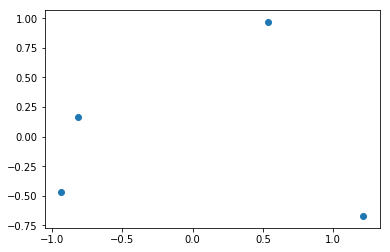

In [347]:
scatter(w_vecs[:,0],w_vecs[:,1])